# `Lateral_Movement_Threat_Detection_with_alerts_and_attack`

# Attack Graph Analytics on Containers Research on Lateral Movement Threat Detection in Kubernetes Environment

## Preliminaries

### Imports

In [1]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
import re
import ast
import os
from collections import defaultdict
from matplotlib import colormaps as cm
import matplotlib.colors

### Define Args

#### Provenance Graph

In [2]:
# Path to Provenance Data
artifact_data_path = 'provenance_data/app_artifact.csv'
process_data_path = 'provenance_data/app_process.csv'
prov_edges_data_path = 'provenance_data/app_edges.csv'

#### Attack Graph

In [3]:
# Path to Attack Graph Directory
ag_dir_path = 'AG'
# Path to Attack Graph Arcs File
ag_arcs_file = f'{ag_dir_path}/ARCS.csv'
# Path to Attack Graph Vertices File
ag_vertices_file = f'{ag_dir_path}/VERTICES.csv'
# Path to Alert Data

#### Attack Simulation

In [4]:
# Path to provenance graph data generated attack simulation logs
attack_generated_artifacts_path = "LM_attack_simulation/attack_scenario123_gen_artifacts.csv"
attack_generated_processes_path = "LM_attack_simulation/attack_scenario123_gen_processes.csv"
attack_generated_edges_path = "LM_attack_simulation/attack_scenario123_gen_edges.csv"

#### Alerts

In [5]:
alerts_data_path = 'alerts_mechanism/alerts_svc_to_rules_with_prov_data.csv'

## Load Provenance Data 

In [6]:
artifacts_df_original = pd.read_csv(artifact_data_path, index_col=0)
processes_df_original = pd.read_csv(process_data_path, index_col=0)
prov_edges_df_original = pd.read_csv(prov_edges_data_path, index_col=0)

### Add Generated Attack Simulation Logs to Provenance Data

In [7]:
generated_artifacts_df = pd.read_csv(attack_generated_artifacts_path)
generated_processes_df = pd.read_csv(attack_generated_processes_path)
generated_edges_df = pd.read_csv(attack_generated_edges_path)

In [8]:
artifacts_df = pd.concat([artifacts_df_original, generated_artifacts_df], ignore_index=True)
processes_df = pd.concat([processes_df_original, generated_processes_df], ignore_index=True)

In [9]:
# Concat the edges dataframes without 'svc_from' and 'svc_to' columns
prov_edges_df = pd.concat([prov_edges_df_original, generated_edges_df.drop(columns=['svc_from', 'svc_to'])], ignore_index=True)

### Save Combined Provenance Data

In [10]:
artifacts_df.to_csv('prov_with_generated_artifacts.csv', index=True)
processes_df.to_csv('prov_with_generated_processes.csv', index=True)
prov_edges_df.to_csv('prov_with_generated_edges.csv', index=True)

## Visualize Final Provenance Data

In [11]:
def create_large_provenance_graph_with_services(artifacts_df, processes_df, edges_df, plot_title, name='prov_graph_full'):
    # Create a directed graph
    PG = nx.DiGraph()

    # Assuming 'service' is the column that indicates the service for each artifact and process
    service_column = 'svc'  # Replace with your actual column name

    # Generate a color palette for services
    services = set(artifacts_df[service_column]).union(set(processes_df[service_column]))
    color_palette = plt.get_cmap('tab20')(range(len(services)))
    service_colors = dict(zip(services, color_palette))

    # Add nodes for artifacts and processes
    for _, row in artifacts_df.iterrows():
        PG.add_node(row['id'], type='Artifact', color=service_colors[row[service_column]])

    for _, row in processes_df.iterrows():
        PG.add_node(row['id'], type='Process', color=service_colors[row[service_column]])

    # Add edges without specific colors
    for _, row in edges_df.iterrows():
        if row['from'] in PG and row['to'] in PG:
            PG.add_edge(row['from'], row['to'])

    # Use a simple layout for large graph
    pos = nx.random_layout(PG)

    # Draw the graph
    plt.figure(figsize=(15, 15))
    for node_type in ['Artifact', 'Process']:
        nx.draw_networkx_nodes(
            PG, pos,
            nodelist=[n for n, d in PG.nodes(data=True) if d['type'] == node_type],
            node_color=[PG.nodes[n]['color'] for n in PG.nodes if PG.nodes[n]['type'] == node_type],
            node_size=100,
            node_shape='s' if node_type == 'Artifact' else 'o'
        )
    nx.draw_networkx_edges(PG, pos, width=0.5, edge_color='grey')  # Generic color for edges

    # Create legend for services
    service_legends = [plt.Line2D([0], [0], marker='s', color='w', label='Artifact (' + str(service) + ')', markersize=10, markerfacecolor=color)
                       for service, color in service_colors.items()]
    process_legends = [plt.Line2D([0], [0], marker='o', color='w', label='Process (' + str(service) + ')', markersize=10, markerfacecolor=color)
                       for service, color in service_colors.items()]
    plt.legend(handles=service_legends + process_legends, loc='upper left', bbox_to_anchor=(1, 1), title="Services & Types")

    plt.title(f"Large Provenance Graph Visualization with Services\n\n{plot_title}")
    plt.axis('off')
    plt.savefig(f'{name}.png', bbox_inches="tight", pad_inches=1)
    # Count number of edges and vertices unfiltered
    print(f"number of edges: {edges_df.shape[0]}")
    print(f"number of vertices: {processes_df.shape[0] + artifacts_df.shape[0]}")
    print(f"number of processes: {processes_df.shape[0]}")
    print(f"number of artifacts: {artifacts_df.shape[0]}")
    plt.show()

### Provenance Graph from Original Data

number of edges: 2550
number of vertices: 2074
number of processes: 496
number of artifacts: 1578


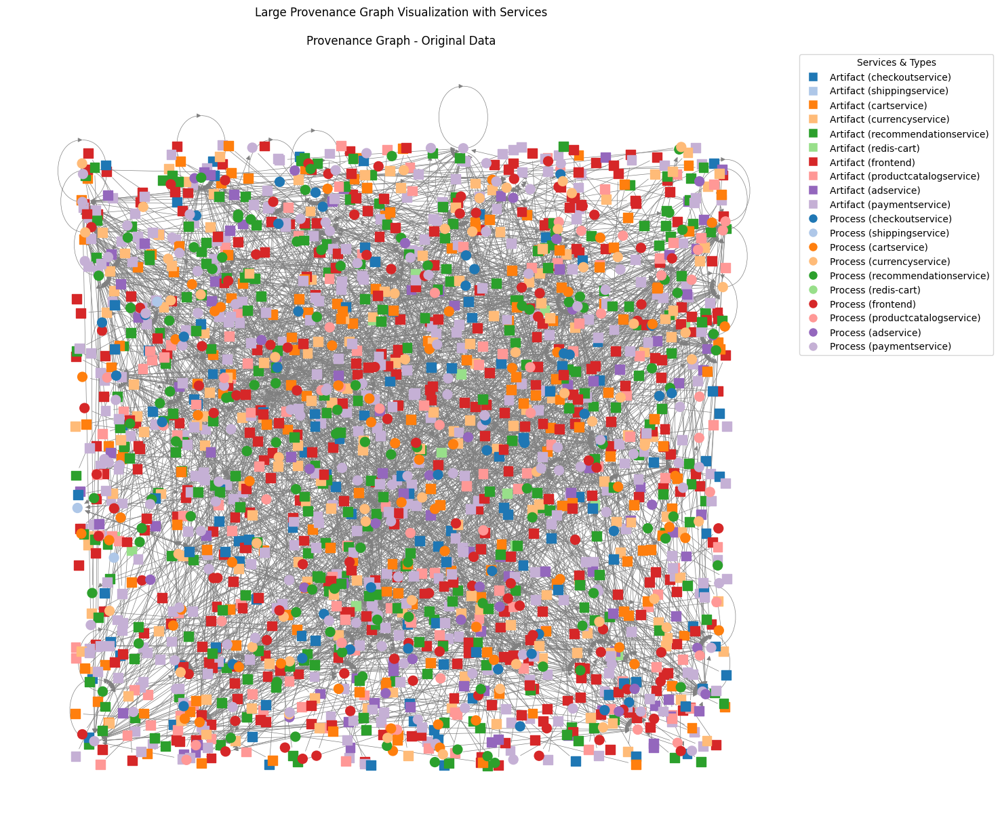

In [12]:
create_large_provenance_graph_with_services(artifacts_df_original, processes_df_original, prov_edges_df_original, plot_title='Provenance Graph - Original Data')

### Provenance Graph with Simulated Attack

number of edges: 2585
number of vertices: 2100
number of processes: 509
number of artifacts: 1591


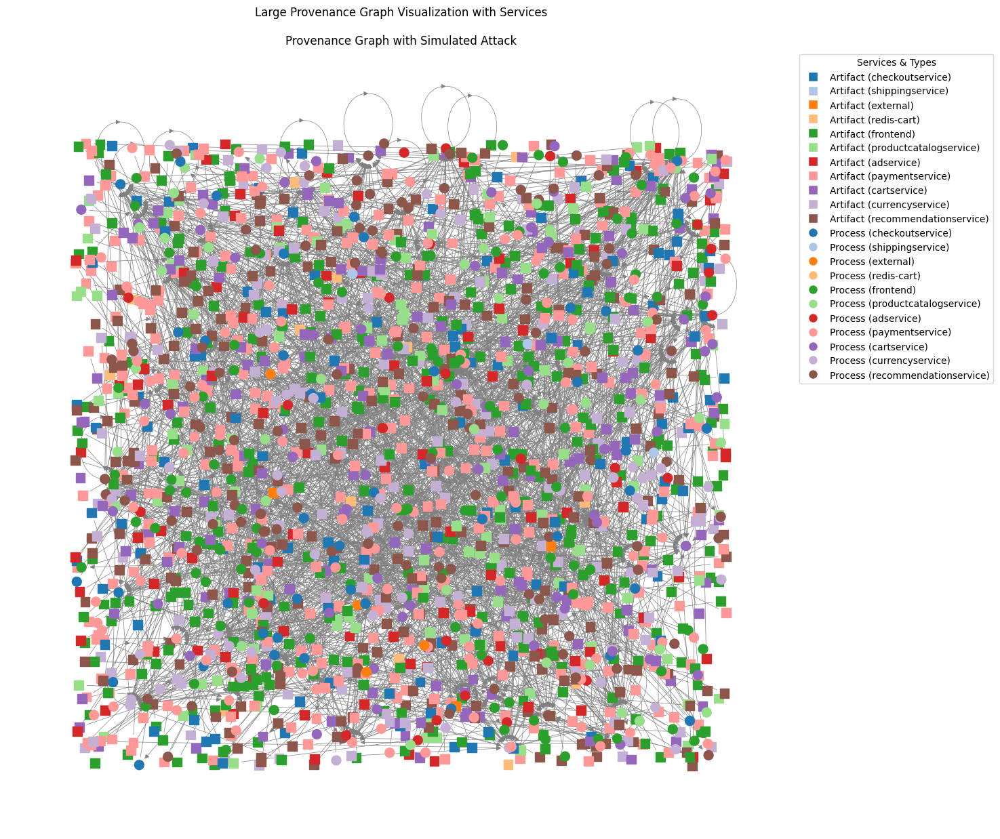

In [13]:
create_large_provenance_graph_with_services(artifacts_df, processes_df, prov_edges_df, plot_title='Provenance Graph with Simulated Attack',
                                            name='prov_graph_full_with_attack')

## Load and Preprocess Attack Graph

In [14]:
def read_and_prepare_AG_data(ag_arcs_file, ag_vertices_file):
    # Reading the arcs file
    ag_arcs_df = pd.read_csv(ag_arcs_file, usecols=[0, 1], header=None)  # Select only the first two columns
    ag_arcs_df.columns = ['End_Node', 'Start_Node']

    # Reading the vertices file
    ag_vertices_df = pd.read_csv(ag_vertices_file, header=None)
    
    # Using the correct headers as per the provided structure
    ag_vertices_df.columns = ['Node_ID', 'Description', 'Type', 'Status']
    return ag_arcs_df, ag_vertices_df

def create_AG_graph(ag_arcs_df, ag_vertices_df):
    # Creating a directed graph
    AG = nx.DiGraph()

    # Adding nodes to the graph with their type and status
    for idx, row in ag_vertices_df.iterrows():
        AG.add_node(row['Node_ID'], description=row['Description'], type=row['Type'], status=row['Status'])

    # Adding edges (arcs) to the graph
    for idx, row in ag_arcs_df.iterrows():
        AG.add_edge(row['Start_Node'], row['End_Node'])

    return AG


def plot_AG_graph(AG):
    # Define figure and axis with enough space for the legend below the graph
    fig, ax = plt.subplots(figsize=(15, 12))
    plt.subplots_adjust(bottom=0.25)  # Adjust the bottom to make space for the legend

    # Using spring layout
    pos = nx.spring_layout(AG, k=0.5, iterations=50)  # Adjust k for optimal distance and iterations for layout precision

    # Scaling factors for the nodes (reduced sizes)
    node_width = 0.03  # Decrease the width for nodes
    node_height = 0.015  # Decrease the height for nodes
    diamond_size = 0.03  # Decrease the size for diamonds
    circle_radius = 0.03  # Decrease the radius for circles

    # Draw nodes with different shapes based on type
    for node, data in AG.nodes(data=True):
        node_type = data['type']
        x, y = pos[node]
        if node_type == 'LEAF':
            # Draw a rectangle for LEAF nodes
            shape = mpatches.FancyBboxPatch((x - node_width/2, y - node_height/2), node_width, node_height, 
                                             boxstyle="round,pad=0.02", fc='skyblue', ec='black')
        elif node_type == 'OR':
            # Draw a diamond for OR nodes
            shape = mpatches.RegularPolygon((x, y), numVertices=4, radius=diamond_size, orientation=0, fc='lightgreen', ec='black')
        else:  # node_type == 'AND'
            # Draw a circle for AND nodes
            shape = plt.Circle((x, y), circle_radius, fc='salmon', ec='black')

        ax.add_patch(shape)

    # Drawing edges
    nx.draw_networkx_edges(AG, pos, width=1.0, alpha=0.5)

    # Node labels - Using Node ID
    nx.draw_networkx_labels(AG, pos, font_size=8, ax=ax)

    # Set title and turn off the axis
    plt.title('Attack Graph Visualization')
    ax.axis('off')  # Turn off the axis
    
    # Create a legend with descriptions, aligned to the left
    legend_labels = {node: data['description'] for node, data in AG.nodes(data=True)}
    legend_text = "\n".join(f"{node_id}: {desc}" for node_id, desc in legend_labels.items())
    
    # Place the legend outside the plot area, aligned to the left
    plt.figtext(0.1, 0.01, legend_text, ha='left', fontsize=8, bbox={"facecolor":"white", "alpha":0.5, "pad":5})

    # Show the plot
    plt.show()

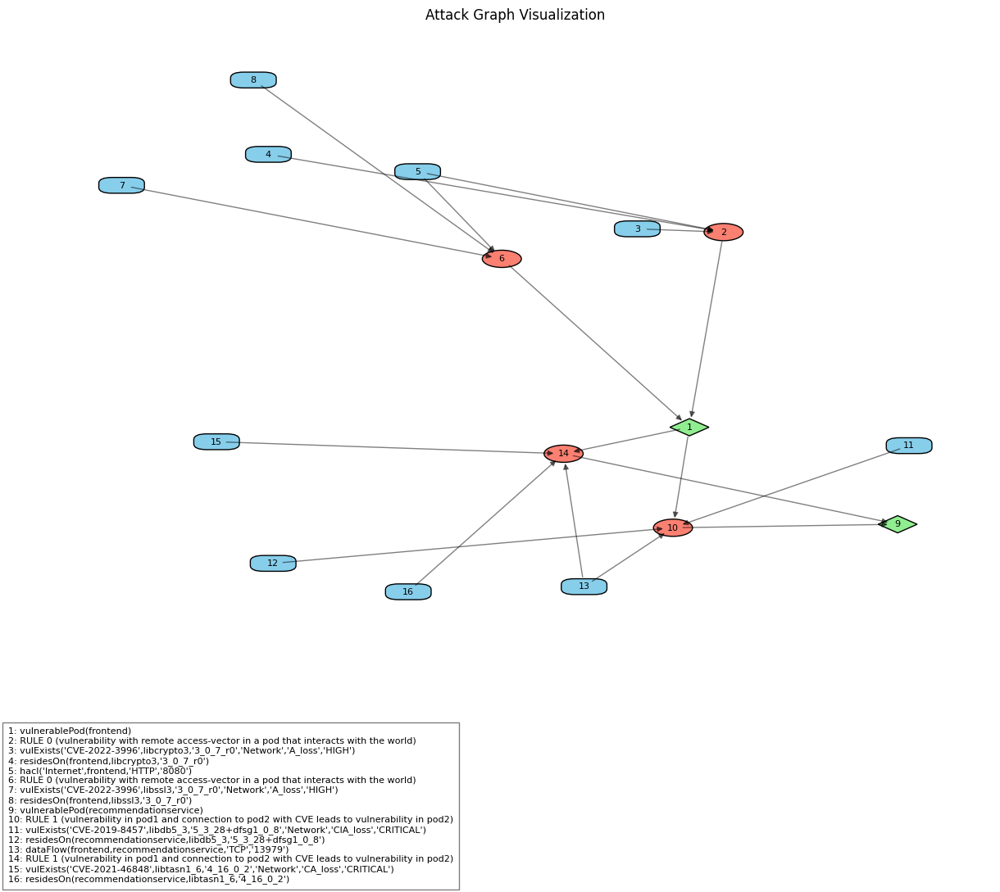

In [15]:
ag_arcs_df, ag_vertices_df = read_and_prepare_AG_data(ag_arcs_file, ag_vertices_file)
AG = create_AG_graph(ag_arcs_df, ag_vertices_df)
plot_AG_graph(AG)

## Load Alert Data

In [16]:
df_alerts = pd.read_csv(alerts_data_path)
df_alerts

,svc,ports,process_ids,rules
0,redis-cart,"[54112, 34050, 34054, 48936, 6379, 34030, 4892...",[],"['proc_creation_win_netsh_fw_allow_rdp.yml', '..."
1,frontend,"[54401, 58508, 58510, 8080, 58512, 57236, 5852...","[11110, 3401, 3434, 19753, 9877, 3447, 'None']","['win_security_rdp_localhost_login.yml', 'file..."
2,paymentservice,"[36032, 50051, 37604, 36038, 45574, 51240, 455...",[],"['win_security_rdp_localhost_login.yml', 'proc..."
3,cartservice,"[46368, 55106, 53666, 49254, 46376, 53678, 551...","[2433, 2434, 1923, 2436, 2435, 2437, 2438, 243...","['win_security_rdp_localhost_login.yml', 'proc..."
4,currencyservice,"[44000, 35042, 43688, 60528, 7000, 43992, 4370...",[],"['win_security_rdp_localhost_login.yml', 'proc..."
5,productcatalogservice,"[52324, 3550, 34350, 52334, 34356, 41176, 4118...",[],"['win_security_rdp_localhost_login.yml', 'proc..."
6,checkoutservice,"[5050, 36036, 37066, 51792, 51798, 37050, 36028]",[],"['win_security_rdp_localhost_login.yml', 'proc..."
7,adservice,"[57410, 48840, 57420, 9555, 48824]","[3331, 2307, 3335, 3338, 3339, 2324, 3107, 221...","['win_security_rdp_localhost_login.yml', 'proc..."
8,external,"[54401, 'None']","[11110, 3401, 19754, 19753, 1234, 9876, 9877, ...","['proc_creation_win_sysinternals_sdelete.yml',..."
9,recommendationservice,[],"[3449, 9879, 9880, 9881, 1723, 1724, 1725, 3447]","['proc_creation_win_powershell_encode.yml', 'p..."


In [17]:
# convert the string representation of lists back to actual lists
df_alerts['rules'] = df_alerts['rules'].apply(ast.literal_eval)
df_alerts['process_ids'] = df_alerts['process_ids'].apply(ast.literal_eval)
df_alerts['ports'] = df_alerts['ports'].apply(ast.literal_eval)

## Filter Provenance Data by Alerted Services

In [18]:
alerted_services = df_alerts['svc']
alerted_services

0               redis-cart
1                 frontend
2           paymentservice
3              cartservice
4          currencyservice
5    productcatalogservice
6          checkoutservice
7                adservice
8                 external
9    recommendationservice
Name: svc, dtype: object

In [19]:
def filter_by_services(app_process, artifacts, edges, services, add_edges=False):
    # Filter processes and artifacts by services
    filtered_processes = app_process[app_process['svc'].isin(services)]
    filtered_artifacts = artifacts[artifacts['svc'].isin(services)]

    # Combine the IDs of filtered processes and artifacts to create a list of remaining node IDs
    remaining_node_ids = pd.concat([filtered_processes['id'], filtered_artifacts['id']])

    # Filter edges where both from and to nodes are in the remaining node list
    if not add_edges:
        filtered_edges = edges[(edges['from'].isin(remaining_node_ids)) & 
                               (edges['to'].isin(remaining_node_ids))]
    elif add_edges:
        filtered_edges = edges[(edges['from'].isin(remaining_node_ids)) | 
                               (edges['to'].isin(remaining_node_ids))]

    return filtered_processes, filtered_artifacts, filtered_edges

In [20]:
alerts_filter_process_df, alerts_filter_artifact_df, alerts_filter_edges_df = filter_by_services(processes_df, artifacts_df, prov_edges_df, alerted_services)

number of edges: 1992
number of vertices: 2097
number of processes: 506
number of artifacts: 1591


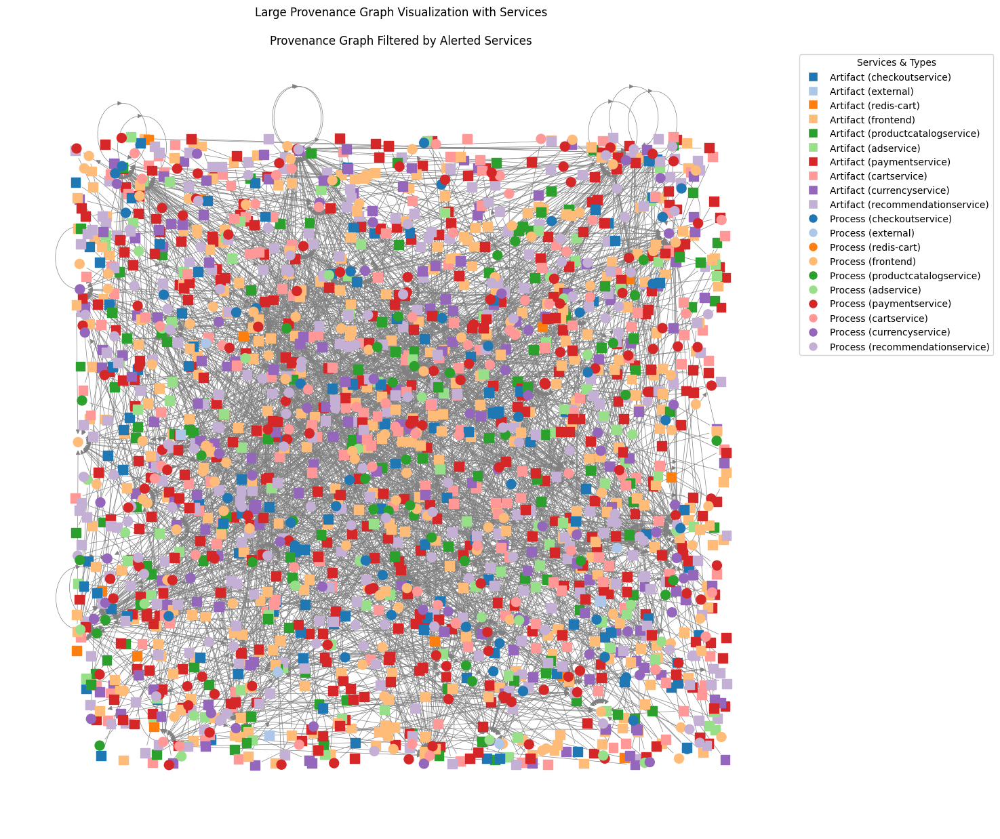

In [21]:
create_large_provenance_graph_with_services(alerts_filter_artifact_df, alerts_filter_process_df, alerts_filter_edges_df, plot_title='Provenance Graph Filtered by Alerted Services')

## Filter Provenance Data by Vulnerable Pods Found in Attack Graph

In [22]:
def find_vulnerable_pods(AG):
    # Regular expression pattern to match descriptions of vulnerable pods
    pattern = re.compile(r'vulnerablePod\((.*?)\)')

    # List to hold the names of vulnerable pods
    vulnerable_pods = []

    # Iterate through each node and its data in the graph
    for node, data in AG.nodes(data=True):
        description = data.get('description', '')
        match = pattern.search(description)
        if match:
            # Extract the pod name from the description and add it to the list
            pod_name = match.group(1)
            vulnerable_pods.append(pod_name)

    return vulnerable_pods

In [23]:
vulnerable_pods = find_vulnerable_pods(AG)
print("Vulnerable Pods:", vulnerable_pods)

Vulnerable Pods: ['frontend', 'recommendationservice']


In [24]:
ag_filter_process_df, ag_filter_artifact_df, ag_filter_edges_df = filter_by_services(alerts_filter_process_df, alerts_filter_artifact_df, alerts_filter_edges_df, vulnerable_pods, add_edges=True)

number of edges: 745
number of vertices: 776
number of processes: 186
number of artifacts: 590


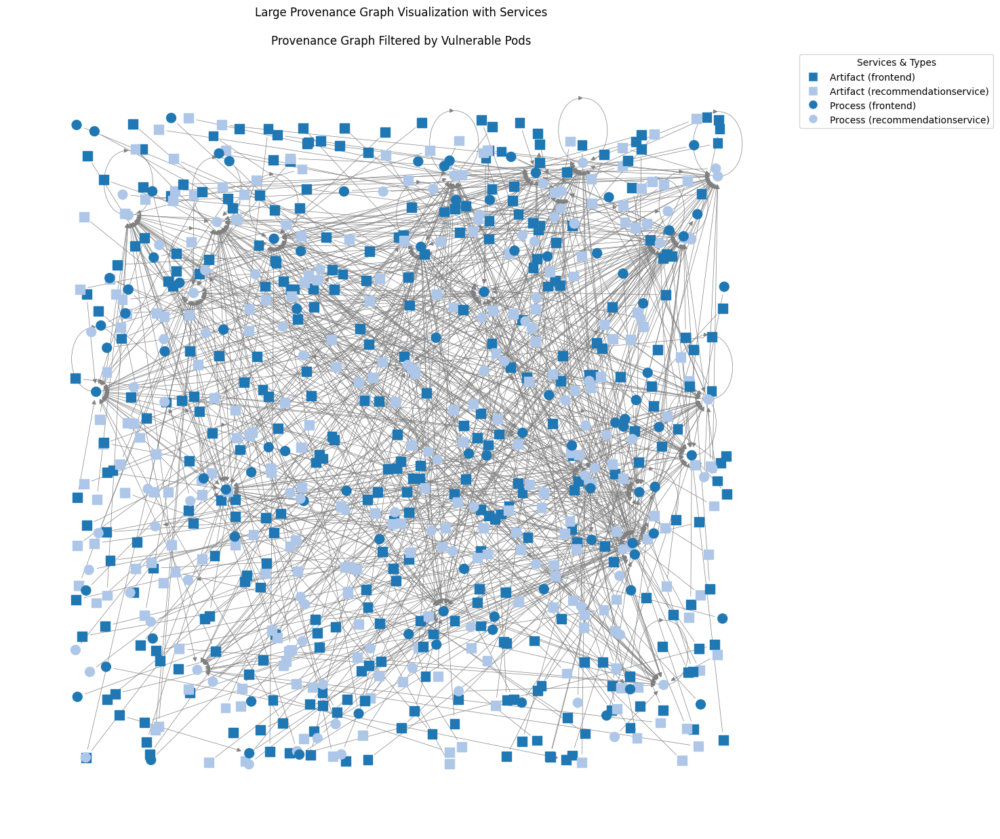

In [25]:
create_large_provenance_graph_with_services(ag_filter_artifact_df, ag_filter_process_df, ag_filter_edges_df, plot_title='Provenance Graph Filtered by Vulnerable Pods')

## Filter Provenance Data by Internet-Facing Services Found in Attack Graph

In [26]:
def find_internet_entry_paths_with_ports(AG):
    # Regular expression pattern to match descriptions indicating internet access with ports
    pattern = re.compile(r"hacl\('Internet',\s*([^,]+),\s*'[^']*',\s*'(\d+)'\)")

    # List to hold the nodes accessible from the internet along with their ports
    internet_accessible_paths = []

    # Iterate through each node and its data in the graph
    for node, data in AG.nodes(data=True):
        description = data.get('description', '')
        matches = pattern.findall(description)
        for match in matches:
            # Each match is a tuple with the node name and port indicating it is accessible from the internet
            internet_accessible_paths.append((match[0].strip(), match[1].strip()))

    return internet_accessible_paths

In [27]:
entry_paths_with_ports = find_internet_entry_paths_with_ports(AG)
print("Services with entry paths from the Internet and their ports:", entry_paths_with_ports)

Services with entry paths from the Internet and their ports: [('frontend', '8080')]


In [28]:
def filter_by_services_and_ports(artifacts_df, processes_df, edges_df, service_port_pairs):
    artifacts_df_port_numeric = artifacts_df.copy()  # Make a copy to avoid the warning
    # Drop rows with missing 'remote port' values
    artifacts_df_port_numeric = artifacts_df_port_numeric.dropna(subset=['remote port'])
    # Convert the port columns to numeric values, handling errors by converting them to NaN
    artifacts_df_port_numeric.loc[:, 'remote port'] = pd.to_numeric(artifacts_df.loc[:, 'remote port'], errors='coerce')
    
    # Initialize a set to hold all target artifact IDs from the specified service-port pairs
    target_ids = set()

    # Iterate over each service-port pair
    for service, port in service_port_pairs:
        # Convert port to a number (float or int) for comparison
        port_num = pd.to_numeric(port)  # float(port) if '.' in port else int(port)

        # Identify artifacts with the specified service and port
        target_artifacts = artifacts_df_port_numeric[
            ((artifacts_df_port_numeric['remote port'] == port_num) | (artifacts_df_port_numeric['local port'] == port_num)) & 
            (artifacts_df_port_numeric['svc'] == service)
        ]
        target_ids.update(target_artifacts['id'])

    print(f"Number of target artifacts for Internet-Entry services and ports: {len(target_ids)}")

    # Create a graph
    PG = nx.DiGraph()

    # Add nodes for all artifacts and processes
    for _, row in artifacts_df_port_numeric.iterrows():
        PG.add_node(row['id'], type='Artifact', svc=row['svc'])
    for _, row in processes_df.iterrows():
        PG.add_node(row['id'], type='Process', svc=row['svc'])

    # Add edges
    for _, row in edges_df.iterrows():
        PG.add_edge(row['from'], row['to'])

    # Find all nodes connected to the target nodes
    connected_nodes = set()
    for node in target_ids:
        ancestors = nx.ancestors(PG, node)
        descendants = nx.descendants(PG, node)
        connected_nodes.update(ancestors)
        connected_nodes.update(descendants)
        connected_nodes.add(node)

    print(f"Number of nodes connected to target artifacts: {len(connected_nodes)}")

    # Filter artifacts and processes DataFrames
    filtered_artifacts = artifacts_df_port_numeric[artifacts_df_port_numeric['id'].isin(connected_nodes)]
    filtered_processes = processes_df[processes_df['id'].isin(connected_nodes)]

    # Filter edges DataFrame
    filtered_edges = edges_df[edges_df['from'].isin(connected_nodes) | edges_df['to'].isin(connected_nodes)]

    return filtered_artifacts, filtered_processes, filtered_edges

In [29]:
ag_internet_filter_artifact_df, ag_internet_filter_process_df, ag_internet_filter_edges_df = filter_by_services_and_ports(ag_filter_artifact_df,ag_filter_process_df, ag_filter_edges_df, entry_paths_with_ports)

Number of target artifacts for Internet-Entry services and ports: 61
Number of nodes connected to target artifacts: 138


number of edges: 658
number of vertices: 114
number of processes: 52
number of artifacts: 62


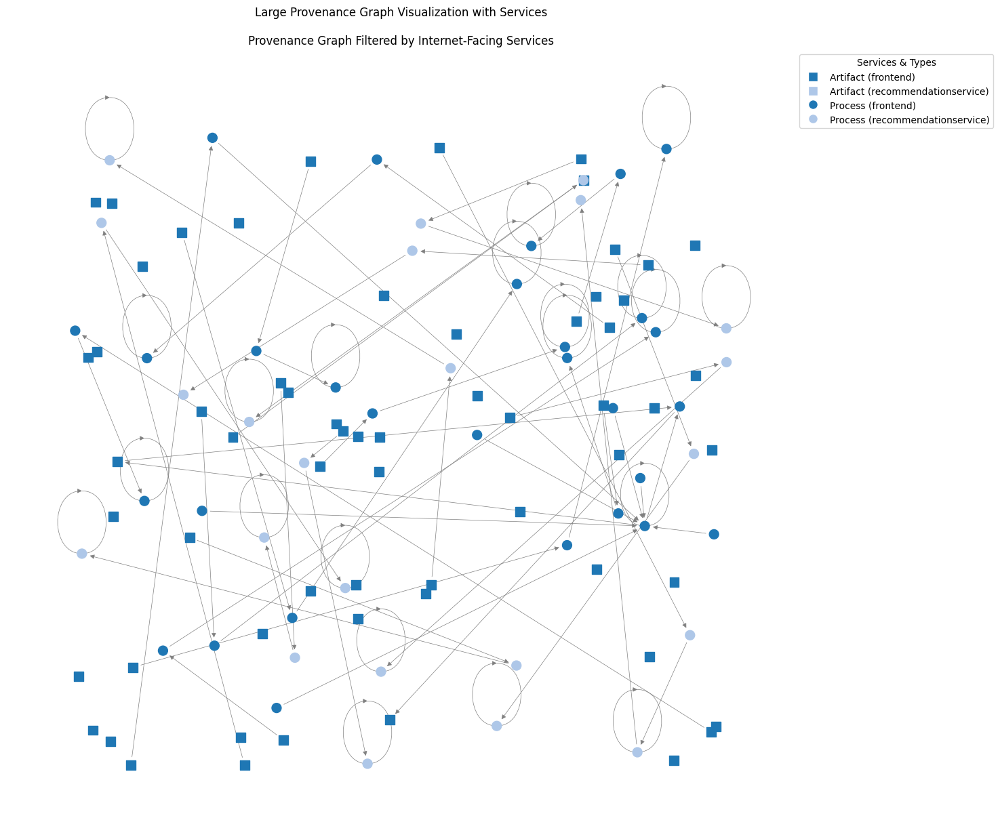

In [30]:
create_large_provenance_graph_with_services(ag_internet_filter_artifact_df, ag_internet_filter_process_df, ag_internet_filter_edges_df, plot_title='Provenance Graph Filtered by Internet-Facing Services')

## Draw Provenance Graph with Custom Labels and Shapes

In [31]:
def draw_graph_with_custom_labels_and_shapes_colored_edge(artifacts_df, processes_df, edges_df, plot_title, name='prov_graph_custom'):
    PG = nx.DiGraph()

    # Generate a color palette for services
    service_column = 'svc'
    services = list(set(artifacts_df[service_column].unique()).union(set(processes_df[service_column].unique())))
    color_map = {services[0]: 'peachpuff', services[1]: 'orchid'} if len(services) == 2 else {services[0]: 'peachpuff'}

    # Edge color mapping
    edge_colors_dict = {
        'WasGeneratedBy': 'red',
        'Used': 'green',
        'WasTriggeredBy': 'blue',
        'WasDerivedFrom': 'yellow'
    }

    # Add nodes and define labels
    labels = {}
    for _, row in artifacts_df.iterrows():
        PG.add_node(row['id'], type='Artifact', svc=row[service_column])
        labels[row['id']] = int(row.get('remote port', '')) if pd.notna(row['remote port']) else 'NaN'

    for _, row in processes_df.iterrows():
        PG.add_node(row['id'], type='Process', svc=row[service_column])
        labels[row['id']] = int(row.get('pid', ''))

    # Add edges and store edge colors
    edge_colors = []
    for _, row in edges_df.iterrows():
        if row['from'] in PG and row['to'] in PG:
            PG.add_edge(row['from'], row['to'])
            edge_type = row.get('type', 'default')
            edge_colors.append(edge_colors_dict.get(edge_type, 'black'))

    # Define positions
    pos = {}
    service_nodes = {svc: [n for n in PG.nodes if PG.nodes[n]['svc'] == svc] for svc in services}
    for svc, nodes in service_nodes.items():
        grid_size = int(np.ceil(np.sqrt(len(nodes))))
        grid_positions = [(x, y) for y in range(grid_size) for x in range(grid_size)]
        if svc == services[0]:
            grid_positions = [(x - grid_size, y) for x, y in grid_positions]  # Shift to the left
        else:
            grid_positions = [(x + 1, y) for x, y in grid_positions]          # Shift to the right
        pos.update({n: pos for n, pos in zip(nodes, grid_positions)})

    # Draw the graph
    plt.figure(figsize=(20, 10))
    for node_type, shape in [('Artifact', 's'), ('Process', 'o')]:
        nodes = [n for n, d in PG.nodes(data=True) if d['type'] == node_type]
        node_colors = [color_map.get(PG.nodes[n]['svc'], 'gray') for n in nodes]
        nx.draw_networkx_nodes(PG, pos, nodelist=nodes, node_size=500, node_color=node_colors, node_shape=shape)

    nx.draw_networkx_edges(PG, pos, edge_color=edge_colors, width=1)
    nx.draw_networkx_labels(PG, pos, labels=labels, font_size=10)

    plt.title(f"Provenance Graph with Custom Labels and Shapes\n\n{plot_title}")
    plt.axis('off')
    plt.savefig(f'{name}.png', bbox_inches="tight", pad_inches=1)
    plt.show()

    # Create a separate figure for the legend
    fig_legend = plt.figure(figsize=(8, 3))
    artifact_patch = plt.Line2D([0], [0], marker='s', color='w', label='Artifact', markersize=10, markerfacecolor='gray', linestyle='None')
    process_patch = plt.Line2D([0], [0], marker='o', color='w', label='Process', markersize=10, markerfacecolor='gray', linestyle='None')
    service_patches = [plt.Line2D([0], [0], marker='o', color=color_map[svc], label=svc, markersize=10, markerfacecolor=color_map[svc], linestyle='None') for svc in services]
    edge_type_patches = [plt.Line2D([0], [0], color=edge_colors_dict[edge_type], lw=2, label=edge_type) for edge_type in edge_colors_dict.keys()]
    plt.legend(handles=[artifact_patch, process_patch] + service_patches + edge_type_patches, loc='center', ncol=2)
    plt.axis('off')
    fig_legend.savefig(f'{name}_legend.png', bbox_inches="tight", pad_inches=1)
    plt.show()

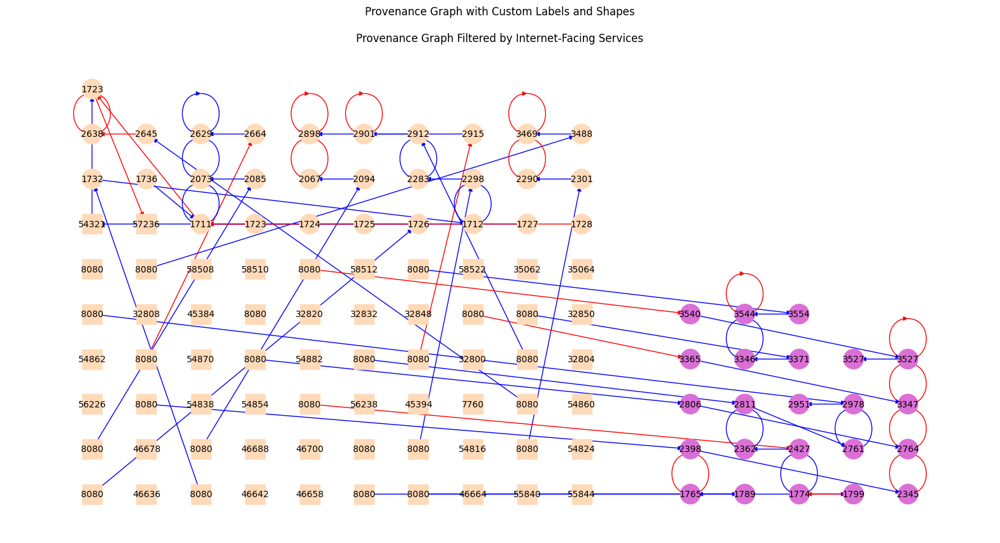

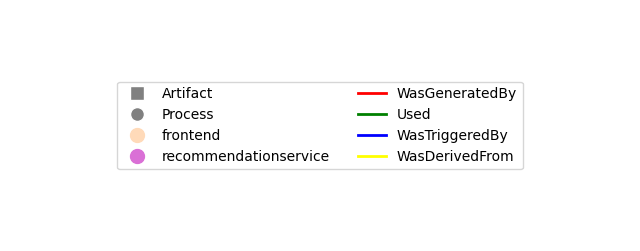

In [32]:
draw_graph_with_custom_labels_and_shapes_colored_edge(ag_internet_filter_artifact_df, ag_internet_filter_process_df, ag_internet_filter_edges_df, plot_title='Provenance Graph Filtered by Internet-Facing Services')

### Draw Provenance Graph with Provenance Colors

In [33]:
def draw_graph_custom_provenance_colors(artifacts_df, processes_df, edges_df, plot_title, name='prov_graph_custom_colors'):
    PG = nx.DiGraph()

    # Generate a color palette for services
    service_column = 'svc'
    services = list(set(artifacts_df[service_column].unique()).union(set(processes_df[service_column].unique())))
    # Flip services for better visualization
    services = services[::-1]
    
    # # Create color maps for Artifacts and Processes
    # artifact_color_map = cm.get_cmap('YlOrBr')
    # process_color_map = cm.get_cmap('Blues')
    # # Create color maps for services
    # artifact_color_map = {svc: artifact_color_map(i / len(services)) for i, svc in enumerate(services)}    
    # process_color_map = {svc: process_color_map(i / len(services)) for i, svc in enumerate(services)}

    artifact_color_map = {'frontend': 'gold', 'recommendationservice': 'yellow'}
    process_color_map = {'frontend': 'powderblue', 'recommendationservice': 'dodgerblue'}

    # Edge color mapping
    edge_colors_dict = {
        'WasGeneratedBy': 'red',
        'Used': 'green',
        'WasTriggeredBy': 'blue',
        'WasDerivedFrom': 'yellow'
    }

    # Add nodes and define labels
    labels = {}
    for _, row in artifacts_df.iterrows():
        PG.add_node(row['id'], type='Artifact', svc=row[service_column])
        labels[row['id']] = int(row.get('remote port', '')) if pd.notna(row['remote port']) else 'NaN'

    for _, row in processes_df.iterrows():
        PG.add_node(row['id'], type='Process', svc=row[service_column])
        labels[row['id']] = int(row.get('pid', ''))

    # Add edges and store edge colors
    edge_colors = []
    for _, row in edges_df.iterrows():
        if row['from'] in PG and row['to'] in PG:
            PG.add_edge(row['from'], row['to'])
            edge_type = row.get('type', 'default')
            edge_colors.append(edge_colors_dict.get(edge_type, 'black'))

    # Define positions
    pos = {}
    service_nodes = {svc: [n for n in PG.nodes if PG.nodes[n]['svc'] == svc] for svc in services}
    for svc, nodes in service_nodes.items():
        grid_size = int(np.ceil(np.sqrt(len(nodes))))
        grid_positions = [(x, y) for y in range(grid_size) for x in range(grid_size)]
        if svc == services[0]:
            grid_positions = [(x - grid_size, y) for x, y in grid_positions]  # Shift to the left
        else:
            grid_positions = [(x + 1, y) for x, y in grid_positions]          # Shift to the right
        pos.update({n: pos for n, pos in zip(nodes, grid_positions)})

    # Draw the graph
    plt.figure(figsize=(20, 10))
    for node_type, shape, color_map in [('Artifact', 's', artifact_color_map), ('Process', 'o', process_color_map)]:
        nodes = [n for n, d in PG.nodes(data=True) if d['type'] == node_type]
        node_colors = [color_map.get(PG.nodes[n]['svc'], 'gray') for n in nodes]
        nx.draw_networkx_nodes(PG, pos, nodelist=nodes, node_size=500, node_color=node_colors, node_shape=shape)

    nx.draw_networkx_edges(PG, pos, edge_color=edge_colors, width=1)
    nx.draw_networkx_labels(PG, pos, labels=labels, font_size=10)

    plt.title(f"Provenance Graph with Custom Labels and Shapes\n\n{plot_title}")
    plt.axis('off')
    plt.savefig(f'{name}.png', bbox_inches="tight", pad_inches=1)
    plt.show()

    # Create a separate figure for the legend
    fig_legend = plt.figure(figsize=(8, 3))
    artifact_patches = [plt.Line2D([0], [0], marker='s', color=artifact_color_map[svc], label=f'Artifact ({svc})', markersize=10, markerfacecolor=artifact_color_map[svc], linestyle='None') for svc in services]
    process_patches = [plt.Line2D([0], [0], marker='o', color=process_color_map[svc], label=f'Process ({svc})', markersize=10, markerfacecolor=process_color_map[svc], linestyle='None') for svc in services]
    # service_patch = plt.Line2D([0], [0], color='w', label='Service', markersize=10, markerfacecolor='gray', linestyle='None')
    edge_type_patches = [plt.Line2D([0], [0], color=edge_colors_dict[edge_type], lw=2, label=edge_type) for edge_type in edge_colors_dict.keys()]
    plt.legend(handles=artifact_patches + process_patches + edge_type_patches, loc='center', ncol=2)
    plt.axis('off')
    fig_legend.savefig(f'{name}_legend.png', bbox_inches="tight", pad_inches=1)
    plt.show()

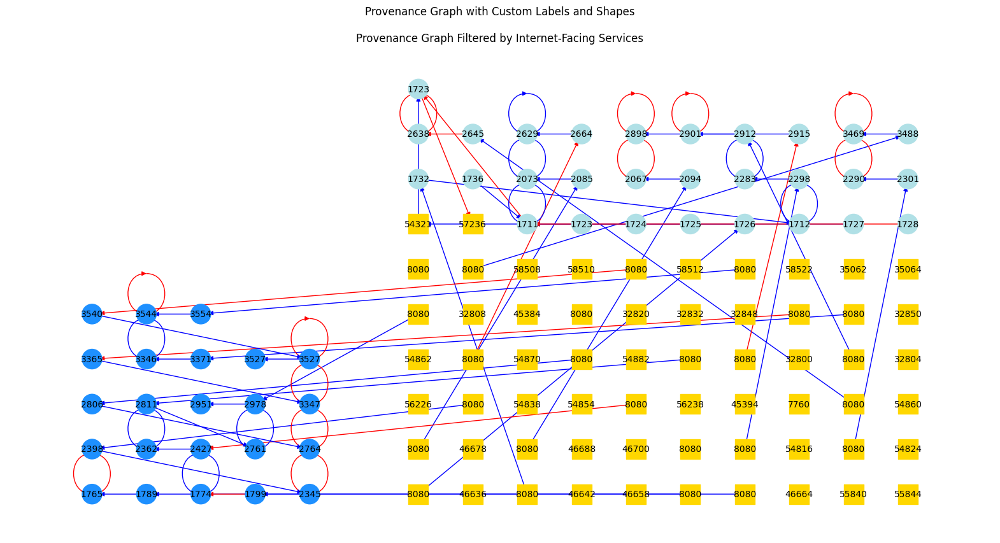

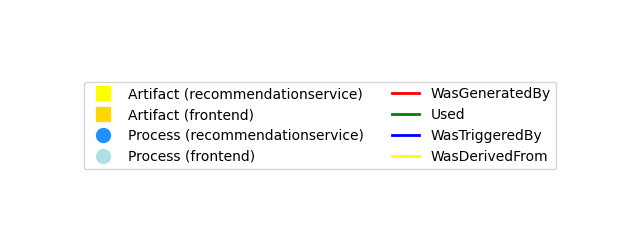

In [34]:
draw_graph_custom_provenance_colors(ag_internet_filter_artifact_df, ag_internet_filter_process_df, ag_internet_filter_edges_df, plot_title='Provenance Graph Filtered by Internet-Facing Services')

### Draw Provenance Graph with Aggregated Nodes

In [35]:
def draw_provenance_graph_custom_aggregated_no_isolated(artifacts_df, processes_df, edges_df, plot_title, name='prov_graph_custom_aggregated'):
    PG = nx.DiGraph()

    # Generate a color palette for services
    service_column = 'svc'
    services = list(set(artifacts_df[service_column].unique()).union(set(processes_df[service_column].unique())))
    # Flip services for better visualization
    services = services[::-1]
    
    artifact_color_map = {'frontend': 'gold', 'recommendationservice': 'yellow'}
    process_color_map = {'frontend': 'powderblue', 'recommendationservice': 'dodgerblue'}

    edge_colors_dict = {
        'WasGeneratedBy': 'red',
        'Used': 'green',
        'WasTriggeredBy': 'blue',
        'WasDerivedFrom': 'yellow'
    }

    # Create dictionaries to store nodes, their labels, and their original IDs
    node_labels = {}
    node_ids = {}

    # Add nodes and store their labels and original IDs
    for _, row in artifacts_df.iterrows():
        # Add node only if it has an edge from/to it
        if row['id'] in set(edges_df['from']).union(set(edges_df['to'])):
            label = int(row.get('remote port', '')) if pd.notna(row['remote port']) else 'NaN'
            node_labels.setdefault(label, []).append(row['id'])
            node_ids[row['id']] = label

    for _, row in processes_df.iterrows():
        # Add node only if it has an edge from/to it
        if row['id'] in set(edges_df['from']).union(set(edges_df['to'])):
            label = int(row.get('pid', ''))
            node_labels.setdefault(label, []).append(row['id'])
            node_ids[row['id']] = label

    # Add nodes to the graph
    for label, node_id_list in node_labels.items():
        PG.add_node(label, type='Artifact' if len(set(artifacts_df['id']).intersection(node_id_list)) else 'Process', node_ids=node_id_list, svc=artifacts_df.loc[artifacts_df['id'].isin(node_id_list), service_column].values[0] if len(set(artifacts_df['id']).intersection(node_id_list)) else processes_df.loc[processes_df['id'].isin(node_id_list), service_column].values[0])

    # Add edges and store edge colors
    edge_colors = []
    for _, row in edges_df.iterrows():
        from_id = row['from']
        to_id = row['to']

        # Check if the node IDs exist in the node_ids dictionary
        if from_id in node_ids and to_id in node_ids:
            from_label = node_ids[from_id]
            to_label = node_ids[to_id]

            if from_label in PG and to_label in PG:
                PG.add_edge(from_label, to_label)
                edge_type = row.get('type', 'default')
                edge_colors.append(edge_colors_dict.get(edge_type, 'black'))

    # Define positions
    pos = {}
    service_nodes = {svc: [n for n in PG.nodes if PG.nodes[n]['svc'] == svc] for svc in services}
    for svc, nodes in service_nodes.items():
        grid_size = int(np.ceil(np.sqrt(len(nodes))))
        grid_positions = [(x, y) for y in range(grid_size) for x in range(grid_size)]
        if svc == services[0]:
            grid_positions = [(x - grid_size, y) for x, y in grid_positions]  # Shift to the left
        else:
            grid_positions = [(x + 1, y) for x, y in grid_positions]          # Shift to the right
        pos.update({n: pos for n, pos in zip(nodes, grid_positions)})

    # Draw the graph
    plt.figure(figsize=(20, 10))
    for node_type, shape, color_map in [('Artifact', 's', artifact_color_map), ('Process', 'o', process_color_map)]:
        nodes = [n for n, d in PG.nodes(data=True) if d['type'] == node_type]
        node_colors = [color_map.get(PG.nodes[n]['svc'], 'gray') for n in nodes]
        nx.draw_networkx_nodes(PG, pos, nodelist=nodes, node_size=500, node_color=node_colors, node_shape=shape)
        nx.draw_networkx_labels(PG, pos, labels={n: n for n in nodes}, font_size=10)

    nx.draw_networkx_edges(PG, pos, edge_color=edge_colors, width=1)

    plt.title(f"Provenance Graph with Custom Labels and Shapes\n\n{plot_title}")
    plt.axis('off')
    plt.savefig(f'{name}.png', bbox_inches="tight", pad_inches=1)
    plt.show()

    # Create a separate figure for the legend
    fig_legend = plt.figure(figsize=(8, 3))
    artifact_patches = [plt.Line2D([0], [0], marker='s', color=artifact_color_map[svc], label=f'Artifact ({svc})', markersize=10, markerfacecolor=artifact_color_map[svc], linestyle='None') for svc in services]
    process_patches = [plt.Line2D([0], [0], marker='o', color=process_color_map[svc], label=f'Process ({svc})', markersize=10, markerfacecolor=process_color_map[svc], linestyle='None') for svc in services]
    edge_type_patches = [plt.Line2D([0], [0], color=edge_colors_dict[edge_type], lw=2, label=edge_type) for edge_type in edge_colors_dict.keys()]
    plt.legend(handles=artifact_patches + process_patches + edge_type_patches, loc='center', ncol=2)
    plt.axis('off')
    fig_legend.savefig(f'{name}_legend.png', bbox_inches="tight", pad_inches=1)
    plt.show()

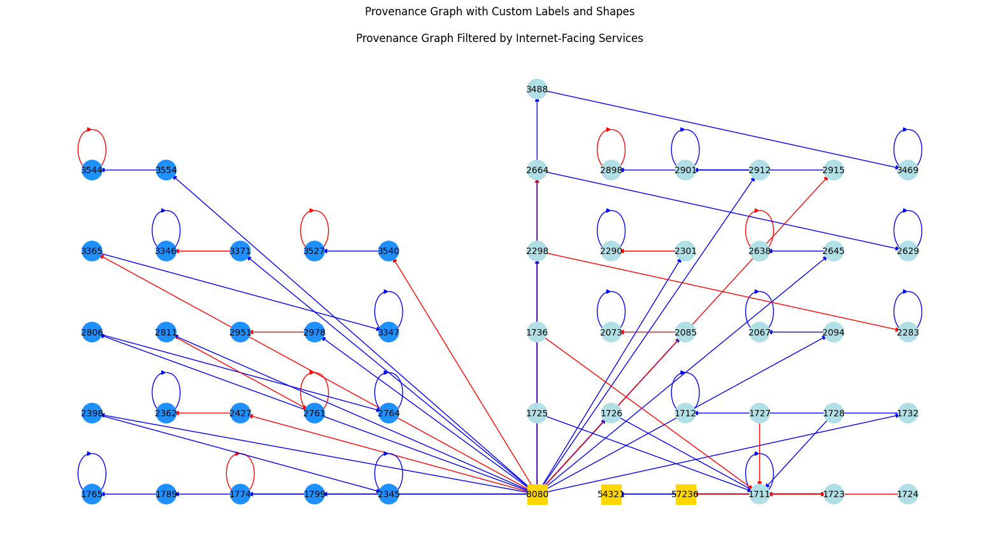

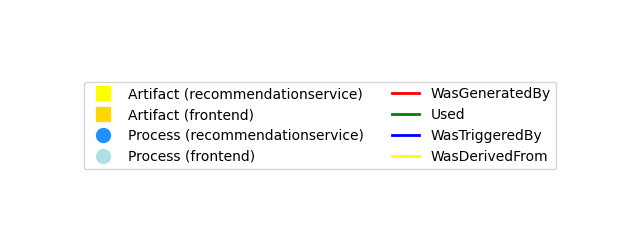

In [36]:
draw_provenance_graph_custom_aggregated_no_isolated(ag_internet_filter_artifact_df, ag_internet_filter_process_df, ag_internet_filter_edges_df, plot_title='Provenance Graph Filtered by Internet-Facing Services')

## Filter Provenance Data by Paths to Alerted Processes From Internet-Facing Services

In [37]:
def filter_paths_to_alerted_processes(processes_df, artifacts_df, edges_df, alerts_data, internet_services_ports):
    # Extract process IDs from alerts data
    alerted_process_ids = set()
    for _, row in alerts_data.iterrows():
        if row['process_ids']:
            for pid in row['process_ids']:
                alerted_process_ids.add(pid)
    
    # Convert 'pid' in processes_df to numeric for matching
    processes_df_numeric = processes_df.copy()  # Make a copy to avoid the warning
    processes_df_numeric['pid'] = pd.to_numeric(processes_df['pid'], errors='coerce')
    alerted_processes = processes_df_numeric[processes_df_numeric['pid'].isin(alerted_process_ids)]
    alerted_node_ids = set(alerted_processes['id'])
    
    # Create a graph
    PG = nx.DiGraph()
    for _, row in artifacts_df.iterrows():
        PG.add_node(row['id'], type='Artifact', svc=row['svc'])
    for _, row in processes_df_numeric.iterrows():
        PG.add_node(row['id'], type='Process', svc=row['svc'])
    for _, row in edges_df.iterrows():
        PG.add_edge(row['from'], row['to'])
    
    # Identify internet-facing nodes based on provided services and ports
    internet_nodes = set()
    for service, port in internet_services_ports:
        port_num = float(port) if '.' in port else int(port)
        target_artifacts = artifacts_df[
            ((artifacts_df['remote port'] == port_num) | (artifacts_df['local port'] == port_num)) & 
            (artifacts_df['svc'] == service)
        ]
        internet_nodes.update(target_artifacts['id'])
    
    # Find paths from internet nodes to alerted processes
    paths_to_alerted = set()
    for internet_node in internet_nodes:
        for alerted_node in alerted_node_ids:
            if nx.has_path(PG, internet_node, alerted_node):
                paths_to_alerted.update(nx.shortest_path(PG, internet_node, alerted_node))

    # Remove isolated nodes (artifacts with no connections)
    isolated_nodes = {node for node in PG.nodes() if PG.in_degree(node) + PG.out_degree(node) == 0}
    paths_to_alerted -= isolated_nodes

    # Filter processes, artifacts, and edges based on the paths to alerted nodes
    filtered_processes = processes_df_numeric[processes_df_numeric['id'].isin(paths_to_alerted)]
    filtered_artifacts = artifacts_df[artifacts_df['id'].isin(paths_to_alerted)]
    filtered_edges = edges_df[edges_df['from'].isin(paths_to_alerted) | edges_df['to'].isin(paths_to_alerted)]
    
    return filtered_processes, filtered_artifacts, filtered_edges

In [38]:
path_alerted_processes_df, path_alerted_artifacts_df, path_alerted_edges_df = filter_paths_to_alerted_processes(ag_internet_filter_process_df, ag_internet_filter_artifact_df, ag_internet_filter_edges_df , df_alerts, entry_paths_with_ports)

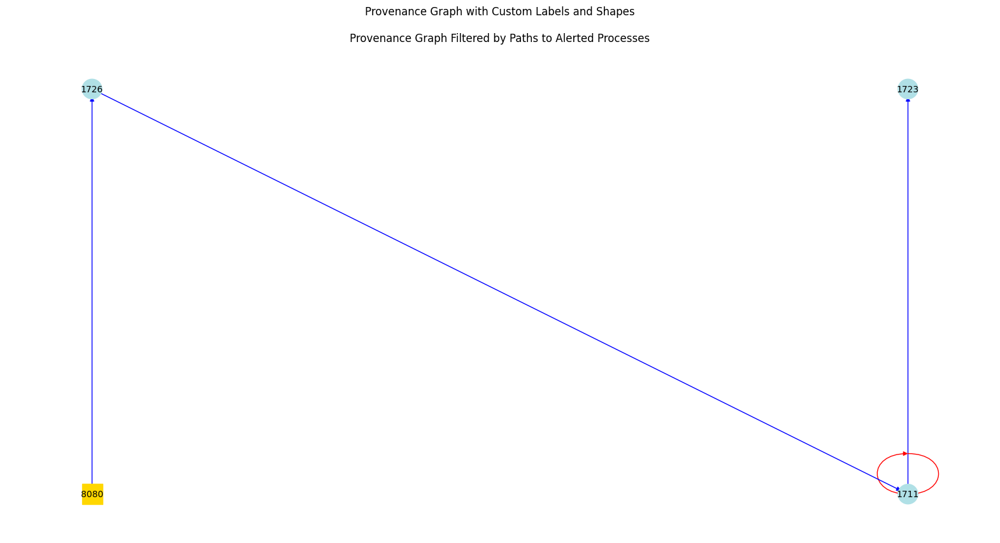

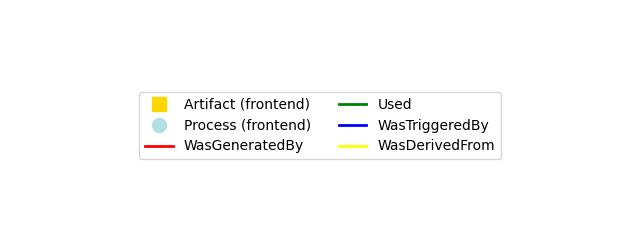

In [39]:
draw_graph_custom_provenance_colors(path_alerted_artifacts_df, path_alerted_processes_df, path_alerted_edges_df, 
                                    plot_title='Provenance Graph Filtered by Paths to Alerted Processes',
                                    name='prov_graph_custom_colors_filtered')

### Filter Provenance Data by Paths to Alerted Processes From Internet-Facing Services and their Connections

In [40]:
def filter_paths_to_alerted_processes_and_internet(processes_df, artifacts_df, edges_df, alerts_data, internet_services_ports):
    # Extract process IDs from alerts data
    alerted_process_ids = set()
    for _, row in alerts_data.iterrows():
        if row['process_ids']:
            for pid in row['process_ids']:
                alerted_process_ids.add(pid)

    # Convert 'pid' in processes_df to numeric for matching
    processes_df_numeric = processes_df.copy()  # Make a copy to avoid the warning
    processes_df_numeric['pid'] = pd.to_numeric(processes_df['pid'], errors='coerce')
    alerted_processes = processes_df_numeric[processes_df_numeric['pid'].isin(alerted_process_ids)]
    alerted_node_ids = set(alerted_processes['id'])

    # Create a graph
    PG = nx.DiGraph()
    for _, row in artifacts_df.iterrows():
        PG.add_node(row['id'], type='Artifact', svc=row['svc'])
    for _, row in processes_df_numeric.iterrows():
        PG.add_node(row['id'], type='Process', svc=row['svc'])
    for _, row in edges_df.iterrows():
        PG.add_edge(row['from'], row['to'])

    # Identify internet-facing nodes based on provided services and ports
    internet_nodes = set()
    for service, port in internet_services_ports:
        port_num = float(port) if '.' in port else int(port)
        target_artifacts = artifacts_df[
            ((artifacts_df['remote port'] == port_num) | (artifacts_df['local port'] == port_num)) & 
            (artifacts_df['svc'] == service)
        ]
        internet_nodes.update(target_artifacts['id'])
        
    internet_nodes_before = internet_nodes.copy()

    # Find alerted ports and processes that are connected to internet ports
    alerted_internet_ports = set()
    alerted_internet_process_ids = set()
    for service, port in internet_services_ports:
        # Find alert rows that include the port
        alerted_internet_ports_rows = alerts_data[alerts_data['ports'].apply(lambda ports_list: int(port) in ports_list)]
        for _, row in alerted_internet_ports_rows.iterrows():
            alerted_internet_ports.update(row['ports'])
            alerted_internet_process_ids.update(row['process_ids'])
    
    # Find target nodes based on alerted ports and processes
    alerted_target_artifacts = pd.DataFrame()
    alerted_target_processes = pd.DataFrame()
    
    for port in alerted_internet_ports:
        alerted_target_artifacts = artifacts_df[
            (artifacts_df['remote port'] == port) | (artifacts_df['local port'] == port)
        ]
        internet_nodes.update(alerted_target_artifacts['id'])   
    for process_id in alerted_internet_process_ids:
        alerted_target_processes = processes_df[
            (processes_df['pid'] == process_id) | (processes_df['ppid'] == process_id)
        ]
        internet_nodes.update(alerted_target_processes['id'])
    
    # print difference between internet nodes before and after
    print(f"Number of internet connected nodes ADDED: {len(internet_nodes)-len(internet_nodes_before)}")

    # Find paths from internet nodes to alerted processes
    paths_to_alerted = set()
    for internet_node in internet_nodes:
        for alerted_node in alerted_node_ids:
            if nx.has_path(PG, internet_node, alerted_node):
                paths_to_alerted.update(nx.shortest_path(PG, internet_node, alerted_node))

    # Remove isolated nodes (artifacts with no connections)
    isolated_nodes = {node for node in PG.nodes() if PG.in_degree(node) + PG.out_degree(node) == 0}
    paths_to_alerted -= isolated_nodes

    # Filter processes, artifacts, and edges based on the paths to alerted nodes
    filtered_processes = processes_df_numeric[processes_df_numeric['id'].isin(paths_to_alerted)]
    filtered_artifacts = artifacts_df[artifacts_df['id'].isin(paths_to_alerted)]
    filtered_edges = edges_df[edges_df['from'].isin(paths_to_alerted) | edges_df['to'].isin(paths_to_alerted)]

    return filtered_processes, filtered_artifacts, filtered_edges

In [41]:
df_alerts[df_alerts['ports'].apply(lambda ports_list: 8080 in ports_list)]

,svc,ports,process_ids,rules
1,frontend,"[54401, 58508, 58510, 8080, 58512, 57236, 5852...","[11110, 3401, 3434, 19753, 9877, 3447, None]","[win_security_rdp_localhost_login.yml, file_ev..."


In [42]:
path_alerted_internet_processes_df, path_alerted_internet_artifacts_df, path_alerted_internet_edges_df = filter_paths_to_alerted_processes_and_internet(ag_internet_filter_process_df, ag_internet_filter_artifact_df, ag_internet_filter_edges_df , df_alerts, entry_paths_with_ports)

Number of internet connected nodes ADDED: 2


### Filter Provenance Data by Paths to Alerted Processes and Ports

In [43]:
def filter_paths_to_alerted_processes_and_ports(processes_df, artifacts_df, edges_df, alerts_data, internet_services_ports):
    # Extract process IDs from alerts data
    alerted_process_ids = set()
    for _, row in alerts_data.iterrows():
        if row['process_ids']:
            for pid in row['process_ids']:
                alerted_process_ids.add(pid)

    # Extract ports from alerts data
    alerted_ports = set()
    for _, row in alerts_data.iterrows():
        if row['ports']:
            for port in row['ports']:
                if port is not None:
                    alerted_ports.add(port)

    # Convert 'pid' in processes_df to numeric for matching
    processes_df_numeric = processes_df.copy()  # Make a copy to avoid the warning
    processes_df_numeric['pid'] = pd.to_numeric(processes_df['pid'], errors='coerce')
    alerted_processes = processes_df_numeric[processes_df_numeric['pid'].isin(alerted_process_ids)]
    alerted_node_ids = set(alerted_processes['id'])

    # Convert 'remote port' and 'local port' in artifacts_df to numeric for matching
    artifacts_df_port_numeric = artifacts_df.copy()  # Make a copy to avoid the warning
    artifacts_df_port_numeric[['remote port', 'local port']] = artifacts_df[['remote port', 'local port']].apply(pd.to_numeric, errors='coerce')
    alerted_artifacts = artifacts_df_port_numeric[
        (artifacts_df_port_numeric['remote port'].isin(alerted_ports)) | 
        (artifacts_df_port_numeric['local port'].isin(alerted_ports))
    ]
    alerted_node_ids.update(alerted_artifacts['id'])

    # Create a graph
    PG = nx.DiGraph()
    for _, row in artifacts_df.iterrows():
        PG.add_node(row['id'], type='Artifact', svc=row['svc'])
    for _, row in processes_df_numeric.iterrows():
        PG.add_node(row['id'], type='Process', svc=row['svc'])
    for _, row in edges_df.iterrows():
        PG.add_edge(row['from'], row['to'])

    # Identify internet-facing nodes based on provided services and ports
    internet_nodes = set()
    for service, port in internet_services_ports:
        port_num = float(port) if '.' in port else int(port)
        target_artifacts = artifacts_df[
            ((artifacts_df['remote port'] == port_num) | (artifacts_df['local port'] == port_num)) & 
            (artifacts_df['svc'] == service)
        ]
        internet_nodes.update(target_artifacts['id'])

    # Find paths from internet nodes to alerted processes
    paths_to_alerted = set()
    for internet_node in internet_nodes:
        for alerted_node in alerted_node_ids:
            if nx.has_path(PG, internet_node, alerted_node):
                paths_to_alerted.update(nx.shortest_path(PG, internet_node, alerted_node))

    # Remove isolated nodes (artifacts with no connections)
    # isolated_nodes = {node for node in PG.nodes() if PG.in_degree(node) + PG.out_degree(node) == 0 + PG.in_degree(node) == 0}
    isolated_nodes = {node for node in PG.nodes() if PG.out_degree(node) == 0 and PG.in_degree(node) == 0}
    paths_to_alerted -= isolated_nodes

    # Filter processes, artifacts, and edges based on the paths to alerted nodes
    filtered_processes = processes_df_numeric[processes_df_numeric['id'].isin(paths_to_alerted)]
    filtered_artifacts = artifacts_df[artifacts_df['id'].isin(paths_to_alerted)]
    filtered_edges = edges_df[edges_df['from'].isin(paths_to_alerted) | edges_df['to'].isin(paths_to_alerted)]

    return filtered_processes, filtered_artifacts, filtered_edges

In [44]:
path_alerted_and_ports_processes_df, path_alerted_and_ports_artifacts_df, path_alerted_and_ports_edges_df = filter_paths_to_alerted_processes_and_ports(ag_internet_filter_process_df, ag_internet_filter_artifact_df, ag_internet_filter_edges_df , df_alerts, entry_paths_with_ports)

## Highlight Paths to Alerted Processes
without isolated nodes

In [45]:
def draw_provenance_graph_custom_highlighted(artifacts_df, processes_df, edges_df, 
                                                highlight_artifacts_df, highlight_processes_df, highlight_edges_df, 
                                                plot_title, name='prov_graph_highlighted'):
    PG = nx.DiGraph()

    # Generate a color palette for services
    service_column = 'svc'
    services = list(set(artifacts_df[service_column].unique()).union(set(processes_df[service_column].unique())))
    
    # # Create color maps for Artifacts and Processes
    # artifact_color_map = cm.get_cmap('YlOrBr')
    # process_color_map = cm.get_cmap('Blues')
    
    # # Create color maps for services
    # artifact_color_map = {svc: artifact_color_map(i / len(services)) for i, svc in enumerate(services)}
    # process_color_map = {svc: process_color_map(i / len(services)) for i, svc in enumerate(services)}
    
    artifact_color_map = {'frontend': 'gold', 'recommendationservice': 'yellow'}
    process_color_map = {'frontend': 'powderblue', 'recommendationservice': 'dodgerblue'}
    highlight_color = 'deeppink'

    # Edge color mapping
    edge_colors_dict = {
        'WasGeneratedBy': 'red',
        'Used': 'green',
        'WasTriggeredBy': 'blue',
        'WasDerivedFrom': 'yellow'
    }

    # Add nodes and define labels
    labels = {}
    for _, row in artifacts_df.iterrows():
        # Add node only if it has an edge from/to it
        if row['id'] in set(highlight_edges_df['from']).union(set(highlight_edges_df['to'])) or row['id'] in set(edges_df['from']).union(set(edges_df['to'])):
            node_color = highlight_color if row['id'] in highlight_artifacts_df['id'].values else artifact_color_map.get(row[service_column], 'gray')
            PG.add_node(row['id'], type='Artifact', svc=row[service_column], color=node_color)
            labels[row['id']] = int(row.get('remote port', '')) if pd.notna(row['remote port']) else 'NaN'

    for _, row in processes_df.iterrows():
        # Add node only if it has an edge from/to it
        if row['id'] in set(highlight_edges_df['from']).union(set(highlight_edges_df['to'])) or row['id'] in set(edges_df['from']).union(set(edges_df['to'])):
            node_color = highlight_color if row['id'] in highlight_processes_df['id'].values else process_color_map.get(row[service_column], 'gray')
            PG.add_node(row['id'], type='Process', svc=row[service_column], color=node_color)
            labels[row['id']] = int(row.get('pid', ''))

    # Add edges and store edge colors
    edge_colors = []
    for _, row in edges_df.iterrows():
        if row['from'] in PG and row['to'] in PG:
            edge_color = highlight_color if row['from'] in highlight_edges_df['from'].values and row['to'] in highlight_edges_df['to'].values else edge_colors_dict.get(row.get('type', 'default'), 'black')
            PG.add_edge(row['from'], row['to'], color=edge_color)
            edge_colors.append(edge_color)

    # Define positions
    pos = {}
    service_nodes = {svc: [n for n in PG.nodes if PG.nodes[n]['svc'] == svc] for svc in services}
    for svc, nodes in service_nodes.items():
        grid_size = int(np.ceil(np.sqrt(len(nodes))))
        grid_positions = [(x, y) for y in range(grid_size) for x in range(grid_size)]
        if svc == services[0]:
            grid_positions = [(x - grid_size, y) for x, y in grid_positions]  # Shift to the left
        else:
            grid_positions = [(x + 1, y) for x, y in grid_positions]          # Shift to the right
        pos.update({n: pos for n, pos in zip(nodes, grid_positions)})

    # Draw the graph
    plt.figure(figsize=(20, 10))
    for node_type, shape, color_map in [('Artifact', 's', artifact_color_map), ('Process', 'o', process_color_map)]:
        nodes = [n for n, d in PG.nodes(data=True) if d['type'] == node_type]
        node_colors = [d['color'] for _, d in PG.nodes(data=True) if d['type'] == node_type]
        nx.draw_networkx_nodes(PG, pos, nodelist=nodes, node_size=500, node_color=node_colors, node_shape=shape)
    
    nx.draw_networkx_edges(PG, pos, edge_color=[PG[u][v]['color'] for u, v in PG.edges()], width=1)
    nx.draw_networkx_labels(PG, pos, labels=labels, font_size=10)

    plt.title(f"Provenance Graph with Custom Labels and Shapes\n\n{plot_title}")
    plt.axis('off')
    plt.savefig(f'{name}.png', bbox_inches="tight", pad_inches=1)
    plt.show()

    # Create a separate figure for the legend
    fig_legend = plt.figure(figsize=(8, 3))
    artifact_patches = [plt.Line2D([0], [0], marker='s', color=artifact_color_map[svc], label=f'Artifact ({svc})', markersize=10, markerfacecolor=artifact_color_map[svc], linestyle='None') for svc in services]
    process_patches = [plt.Line2D([0], [0], marker='o', color=process_color_map[svc], label=f'Process ({svc})', markersize=10, markerfacecolor=process_color_map[svc], linestyle='None') for svc in services]
    highlight_patch = plt.Line2D([0], [0], marker='*', color=highlight_color, lw=2, label='Highlighted', markersize=10, markerfacecolor=highlight_color, linestyle='None')
    edge_type_patches = [plt.Line2D([0], [0], color=edge_colors_dict[edge_type], lw=2, label=edge_type) for edge_type in edge_colors_dict.keys()]
    plt.legend(handles=artifact_patches + process_patches + [highlight_patch] + edge_type_patches, loc='center', ncol=2)
    plt.axis('off')
    fig_legend.savefig(f'{name}_legend.png', bbox_inches="tight", pad_inches=1)
    plt.show()

### Highlight Paths to Alerted Processes From Internet-Facing Services

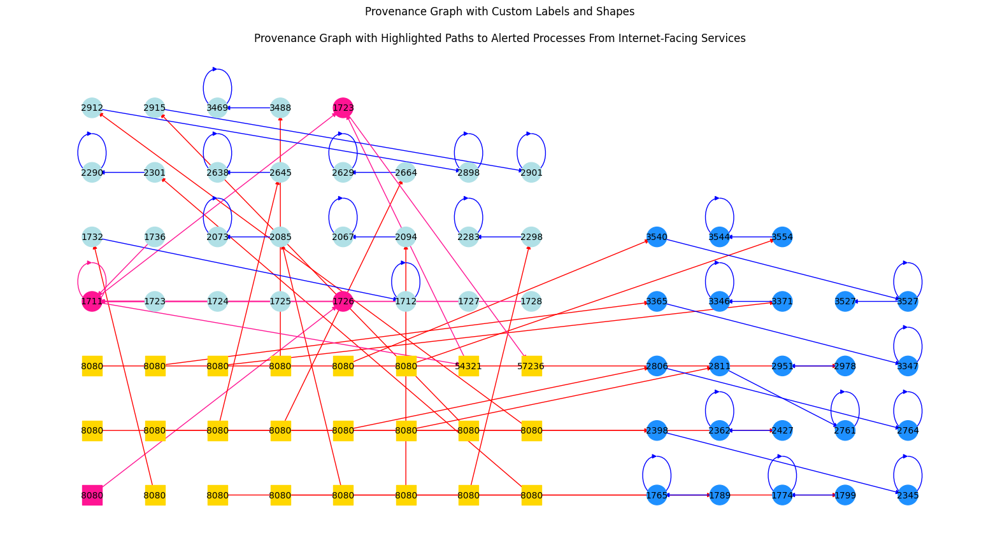

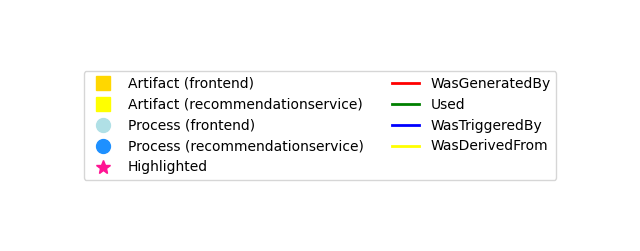

In [46]:
draw_provenance_graph_custom_highlighted(ag_internet_filter_artifact_df, ag_internet_filter_process_df, ag_internet_filter_edges_df,
                                         path_alerted_artifacts_df, path_alerted_processes_df, path_alerted_edges_df,
                                         plot_title='Provenance Graph with Highlighted Paths to Alerted Processes From Internet-Facing Services')

### Highlight Paths to Alerted Processes From Internet-Facing Services and their Connections

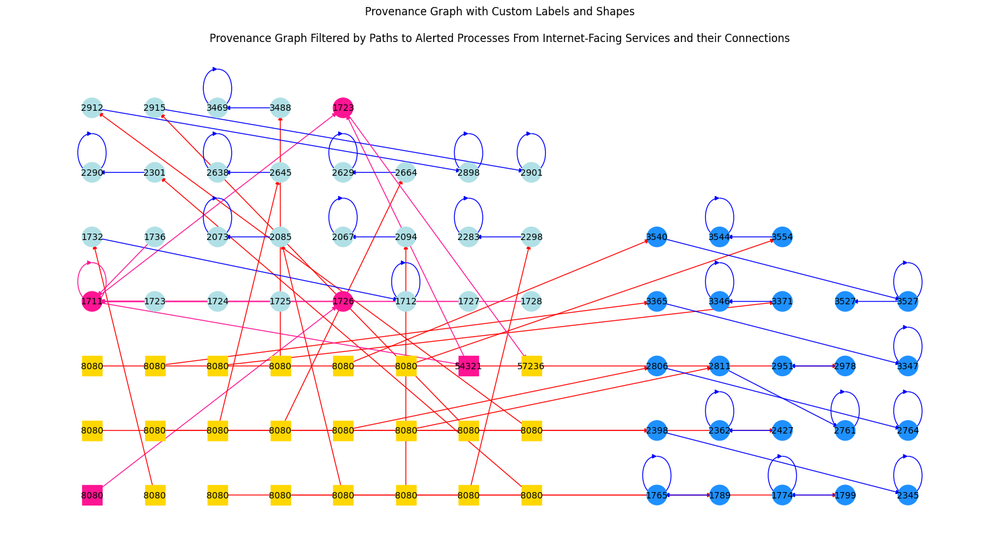

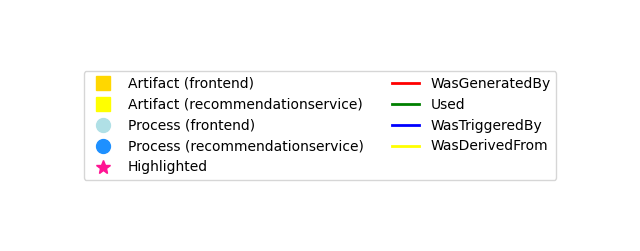

In [47]:
draw_provenance_graph_custom_highlighted(ag_internet_filter_artifact_df, ag_internet_filter_process_df, ag_internet_filter_edges_df,
                                         path_alerted_internet_artifacts_df, path_alerted_internet_processes_df, path_alerted_internet_edges_df, plot_title='Provenance Graph Filtered by Paths to Alerted Processes From Internet-Facing Services and their Connections')

### Highlight Paths to Alerted Processes and Ports

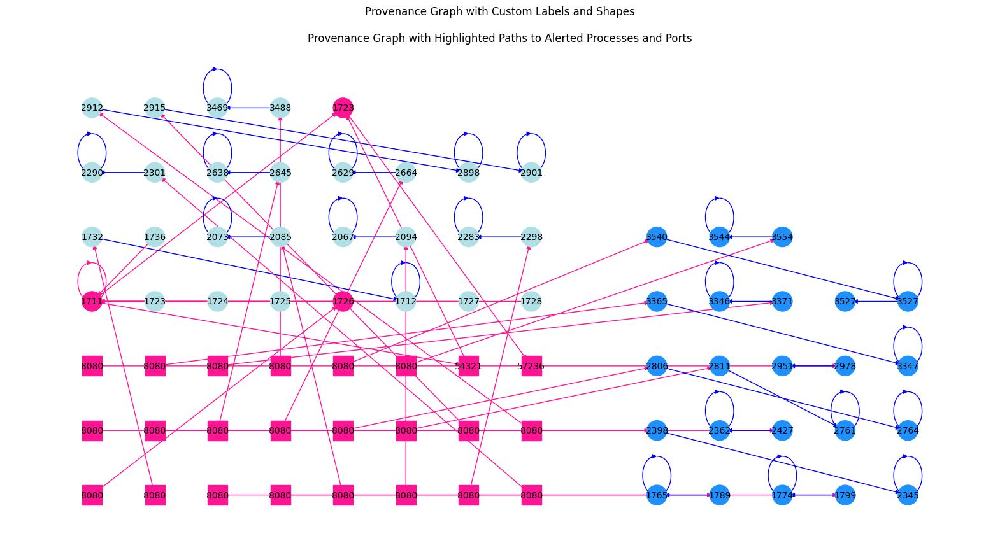

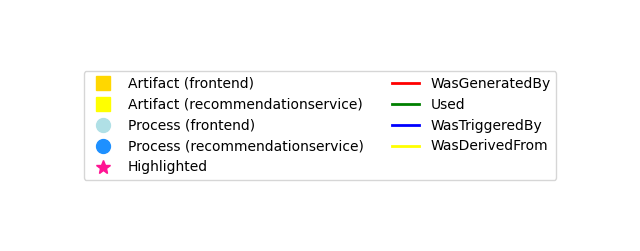

In [48]:
draw_provenance_graph_custom_highlighted(
    ag_internet_filter_artifact_df, ag_internet_filter_process_df, ag_internet_filter_edges_df,
    path_alerted_and_ports_artifacts_df, path_alerted_and_ports_processes_df, path_alerted_and_ports_edges_df,
    plot_title='Provenance Graph with Highlighted Paths to Alerted Processes and Ports')

### Draw Highlighted Provenance Graph with Aggregated Nodes

In [49]:
def draw_provenance_graph_custom_highlighted_aggregated(artifacts_df, processes_df, edges_df,
                                                        highlight_artifacts_df, highlight_processes_df, highlight_edges_df,
                                                        plot_title, name='prov_graph_highlighted'):
    PG = nx.DiGraph()

    # Generate a color palette for services
    service_column = 'svc'
    services = list(set(artifacts_df[service_column].unique()).union(set(processes_df[service_column].unique())))
    # Flip services for better visualization
    services = services[::-1]

    # Color mappings for artifacts and processes
    artifact_color_map = {'frontend': 'gold', 'recommendationservice': 'yellow'}
    process_color_map = {'frontend': 'powderblue', 'recommendationservice': 'dodgerblue'}
    highlight_color = 'deeppink'

    # Edge color mapping
    edge_colors_dict = {
        'WasGeneratedBy': 'red',
        'Used': 'green',
        'WasTriggeredBy': 'blue',
        'WasDerivedFrom': 'yellow'
    }

    # Create dictionaries to store nodes, their labels, and their original IDs
    node_labels = {}
    node_ids = {}

    # Add nodes and store their labels and original IDs
    for _, row in artifacts_df.iterrows():
        # Add node only if it has an edge from/to it
        if row['id'] in set(highlight_edges_df['from']).union(set(highlight_edges_df['to'])) or row['id'] in set(edges_df['from']).union(set(edges_df['to'])):
            label = int(row.get('remote port', '')) if pd.notna(row['remote port']) else 'NaN'
            node_labels.setdefault(label, []).append(row['id'])
            node_ids[row['id']] = label

    for _, row in processes_df.iterrows():
        # Add node only if it has an edge from/to it
        if row['id'] in set(highlight_edges_df['from']).union(set(highlight_edges_df['to'])) or row['id'] in set(edges_df['from']).union(set(edges_df['to'])):
            label = int(row.get('pid', ''))
            node_labels.setdefault(label, []).append(row['id'])
            node_ids[row['id']] = label

    # Add nodes to the graph
    for label, node_id_list in node_labels.items():
        node_type = 'Artifact' if len(set(artifacts_df['id']).intersection(node_id_list)) else 'Process'
        node_svc = artifacts_df.loc[artifacts_df['id'].isin(node_id_list), service_column].values[0] if node_type == 'Artifact' else processes_df.loc[processes_df['id'].isin(node_id_list), service_column].values[0]
        node_color = highlight_color if label in highlight_artifacts_df['remote port'].values or label in highlight_processes_df['pid'].values else (
            artifact_color_map.get(node_svc, 'gray')) if node_type == 'Artifact' else process_color_map.get(node_svc, 'gray')
        # node_color = 'lime' if label in highlight_artifacts_df['remote port'].values or label in highlight_processes_df['pid'].values or any(node_id in highlight_artifacts_df['id'].values or node_id in highlight_processes_df['id'].values for node_id in node_id_list) else (
        #     artifact_color_map.get(node_svc, 'gray')) if node_type == 'Artifact' else process_color_map.get(node_svc, 'gray')
        PG.add_node(label, type=node_type, node_ids=node_id_list, svc=node_svc, color=node_color)

    # Add edges and store edge colors
    edge_colors = []
    for _, row in edges_df.iterrows():
        from_id = row['from']
        to_id = row['to']

        # Check if the node IDs exist in the node_ids dictionary
        if from_id in node_ids and to_id in node_ids:
            from_label = node_ids[from_id]
            to_label = node_ids[to_id]

            if from_label in PG and to_label in PG:
                edge_color = highlight_color if from_id in highlight_edges_df['from'].values and to_id in highlight_edges_df['to'].values else edge_colors_dict.get(row.get('type', 'default'), 'black')
                PG.add_edge(from_label, to_label, color=edge_color)
                edge_colors.append(edge_color)

    # Define positions
    pos = {}
    service_nodes = {svc: [n for n in PG.nodes if PG.nodes[n]['svc'] == svc] for svc in services}
    for svc, nodes in service_nodes.items():
        grid_size = int(np.ceil(np.sqrt(len(nodes))))
        grid_positions = [(x, y) for y in range(grid_size) for x in range(grid_size)]
        if svc == services[0]:
            grid_positions = [(x - grid_size, y) for x, y in grid_positions]  # Shift to the left
        else:
            grid_positions = [(x + 1, y) for x, y in grid_positions]          # Shift to the right
        pos.update({n: pos for n, pos in zip(nodes, grid_positions)})

    # Draw the graph
    plt.figure(figsize=(20, 10))
    for node_type, shape, color_map in [('Artifact', 's', artifact_color_map), ('Process', 'o', process_color_map)]:
        nodes = [n for n, d in PG.nodes(data=True) if d['type'] == node_type]
        node_colors = [d['color'] for _, d in PG.nodes(data=True) if d['type'] == node_type]
        nx.draw_networkx_nodes(PG, pos, nodelist=nodes, node_size=500, node_color=node_colors, node_shape=shape)
        nx.draw_networkx_labels(PG, pos, labels={n: n for n in nodes}, font_size=10)

    nx.draw_networkx_edges(PG, pos, edge_color=edge_colors, width=1)  

    plt.title(f"Provenance Graph with Custom Labels and Shapes\n\n{plot_title}")
    plt.axis('off')
    plt.savefig(f'{name}.png', bbox_inches="tight", pad_inches=1)
    plt.show()

    # Create a separate figure for the legend
    fig_legend = plt.figure(figsize=(8, 3))
    artifact_patches = [plt.Line2D([0], [0], marker='s', color=artifact_color_map[svc], label=f'Artifact ({svc})', markersize=10, markerfacecolor=artifact_color_map[svc], linestyle='None') for svc in services]
    process_patches = [plt.Line2D([0], [0], marker='o', color=process_color_map[svc], label=f'Process ({svc})', markersize=10, markerfacecolor=process_color_map[svc], linestyle='None') for svc in services]
    highlight_patch = plt.Line2D([0], [0], marker='*', color=highlight_color, lw=2, label='Highlighted', markersize=10, markerfacecolor=highlight_color, linestyle='None')
    edge_type_patches = [plt.Line2D([0], [0], color=edge_colors_dict[edge_type], lw=2, label=edge_type) for edge_type in edge_colors_dict.keys()]
    plt.legend(handles=artifact_patches + process_patches + [highlight_patch] + edge_type_patches, loc='center', ncol=2)
    plt.axis('off')
    fig_legend.savefig(f'{name}_legend.png', bbox_inches="tight", pad_inches=1)
    plt.show()
    return PG

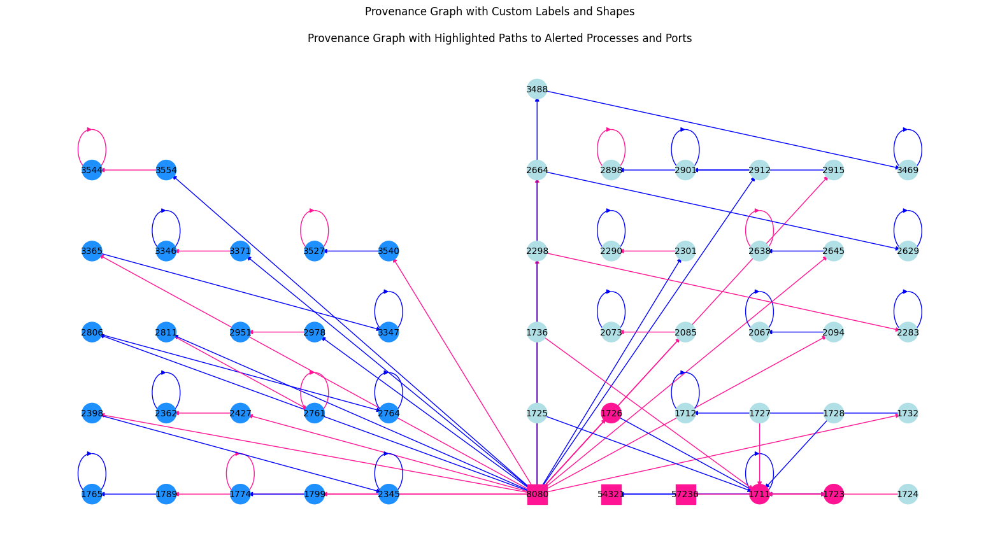

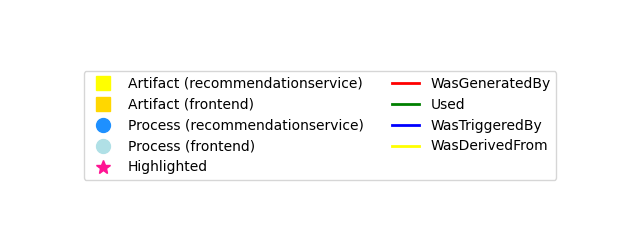

In [50]:
PG_highlighted_aggregated = draw_provenance_graph_custom_highlighted_aggregated(
    ag_internet_filter_artifact_df, ag_internet_filter_process_df, ag_internet_filter_edges_df,
    path_alerted_and_ports_artifacts_df, path_alerted_and_ports_processes_df, path_alerted_and_ports_edges_df,
    plot_title='Provenance Graph with Highlighted Paths to Alerted Processes and Ports')

### Draw Highlighted Provenance Graph with Processes Names

In [80]:
def draw_provenance_graph_custom_highlighted_aggregated_names(artifacts_df, processes_df, edges_df,
                                                        highlight_artifacts_df, highlight_processes_df, highlight_edges_df,
                                                        plot_title, name='prov_graph_highlighted_names'):
    PG = nx.DiGraph()

    # Generate a color palette for services
    service_column = 'svc'
    services = list(set(artifacts_df[service_column].unique()).union(set(processes_df[service_column].unique())))
    # Flip services for better visualization
    services = services[::-1]

    # Color mappings for artifacts and processes
    artifact_color_map = {'frontend': 'gold', 'recommendationservice': 'yellow'}
    process_color_map = {'frontend': 'powderblue', 'recommendationservice': 'dodgerblue'}
    highlight_color = 'deeppink'

    # Edge color mapping
    edge_colors_dict = {
        'WasGeneratedBy': 'red',
        'Used': 'green',
        'WasTriggeredBy': 'blue',
        'WasDerivedFrom': 'yellow'
    }

    # Create dictionaries to store nodes, their labels, and their original IDs
    node_labels = {}
    node_ids = {}

    # Add nodes and store their labels and original IDs
    for _, row in artifacts_df.iterrows():
        # Add node only if it has an edge from/to it
        if row['id'] in set(highlight_edges_df['from']).union(set(highlight_edges_df['to'])) or row['id'] in set(edges_df['from']).union(set(edges_df['to'])):
            label = int(row.get('remote port', '')) if pd.notna(row['remote port']) else 'NaN'
            node_labels.setdefault(label, []).append(row['id'])
            node_ids[row['id']] = label

    for _, row in processes_df.iterrows():
        # Add node only if it has an edge from/to it
        if row['id'] in set(highlight_edges_df['from']).union(set(highlight_edges_df['to'])) or row['id'] in set(edges_df['from']).union(set(edges_df['to'])):
            label = int(row.get('pid', ''))
            node_labels.setdefault(label, []).append(row['id'])
            node_ids[row['id']] = label

    # Add nodes to the graph
    for label, node_id_list in node_labels.items():
        node_type = 'Artifact' if len(set(artifacts_df['id']).intersection(node_id_list)) else 'Process'
        node_svc = artifacts_df.loc[artifacts_df['id'].isin(node_id_list), service_column].values[0] if node_type == 'Artifact' else processes_df.loc[processes_df['id'].isin(node_id_list), service_column].values[0]
        node_color = highlight_color if label in highlight_artifacts_df['remote port'].values or label in highlight_processes_df['pid'].values else (
            artifact_color_map.get(node_svc, 'gray')) if node_type == 'Artifact' else process_color_map.get(node_svc, 'gray')
        node_process_name = processes_df.loc[processes_df['pid'] == label, 'name'].values[0] if node_type == 'Process' else label
        if node_type == 'Process' and node_process_name:
            PG.add_node(label, type=node_type, node_ids=node_id_list, svc=node_svc, color=node_color, process=node_process_name)
        else:
            PG.add_node(label, type=node_type, node_ids=node_id_list, svc=node_svc, color=node_color)

    # Add edges and store edge colors
    edge_colors = []
    for _, row in edges_df.iterrows():
        from_id = row['from']
        to_id = row['to']

        # Check if the node IDs exist in the node_ids dictionary
        if from_id in node_ids and to_id in node_ids:
            from_label = node_ids[from_id]
            to_label = node_ids[to_id]

            if from_label in PG and to_label in PG:
                edge_color = highlight_color if from_id in highlight_edges_df['from'].values and to_id in highlight_edges_df['to'].values else edge_colors_dict.get(row.get('type', 'default'), 'black')
                PG.add_edge(from_label, to_label, color=edge_color)
                edge_colors.append(edge_color)

    # Define positions
    pos = {}
    service_nodes = {svc: [n for n in PG.nodes if PG.nodes[n]['svc'] == svc] for svc in services}
    for svc, nodes in service_nodes.items():
        grid_size = int(np.ceil(np.sqrt(len(nodes))))
        grid_positions = [(x, y) for y in range(grid_size) for x in range(grid_size)]
        if svc == services[0]:
            grid_positions = [(x - grid_size, y) for x, y in grid_positions]  # Shift to the left
        else:
            grid_positions = [(x + 1, y) for x, y in grid_positions]          # Shift to the right
        pos.update({n: pos for n, pos in zip(nodes, grid_positions)})

    # Draw the graph
    plt.figure(figsize=(20, 10))
    for node_type, shape, color_map in [('Artifact', 's', artifact_color_map), ('Process', 'o', process_color_map)]:
        nodes = [n for n, d in PG.nodes(data=True) if d['type'] == node_type]
        node_colors = [d['color'] for _, d in PG.nodes(data=True) if d['type'] == node_type]
        nx.draw_networkx_nodes(PG, pos, nodelist=nodes, node_size=500, node_color=node_colors, node_shape=shape)
        if node_type == 'Process':
            nx.draw_networkx_labels(PG, pos, labels={n: PG.nodes[n].get('process', n) for n in nodes}, font_size=10)
        else:
            nx.draw_networkx_labels(PG, pos, labels={n: n for n in nodes}, font_size=10)

    nx.draw_networkx_edges(PG, pos, edge_color=edge_colors, width=1)  

    plt.title(f"Provenance Graph with Custom Labels and Shapes\n\n{plot_title}")
    plt.axis('off')
    plt.savefig(f'{name}.png', bbox_inches="tight", pad_inches=1)
    plt.show()

    # Create a separate figure for the legend
    fig_legend = plt.figure(figsize=(8, 3))
    artifact_patches = [plt.Line2D([0], [0], marker='s', color=artifact_color_map[svc], label=f'Artifact ({svc})', markersize=10, markerfacecolor=artifact_color_map[svc], linestyle='None') for svc in services]
    process_patches = [plt.Line2D([0], [0], marker='o', color=process_color_map[svc], label=f'Process ({svc})', markersize=10, markerfacecolor=process_color_map[svc], linestyle='None') for svc in services]
    highlight_patch = plt.Line2D([0], [0], marker='*', color=highlight_color, lw=2, label='Highlighted', markersize=10, markerfacecolor=highlight_color, linestyle='None')
    edge_type_patches = [plt.Line2D([0], [0], color=edge_colors_dict[edge_type], lw=2, label=edge_type) for edge_type in edge_colors_dict.keys()]
    plt.legend(handles=artifact_patches + process_patches + [highlight_patch] + edge_type_patches, loc='center', ncol=2)
    plt.axis('off')
    fig_legend.savefig(f'{name}_legend.png', bbox_inches="tight", pad_inches=1)
    plt.show()

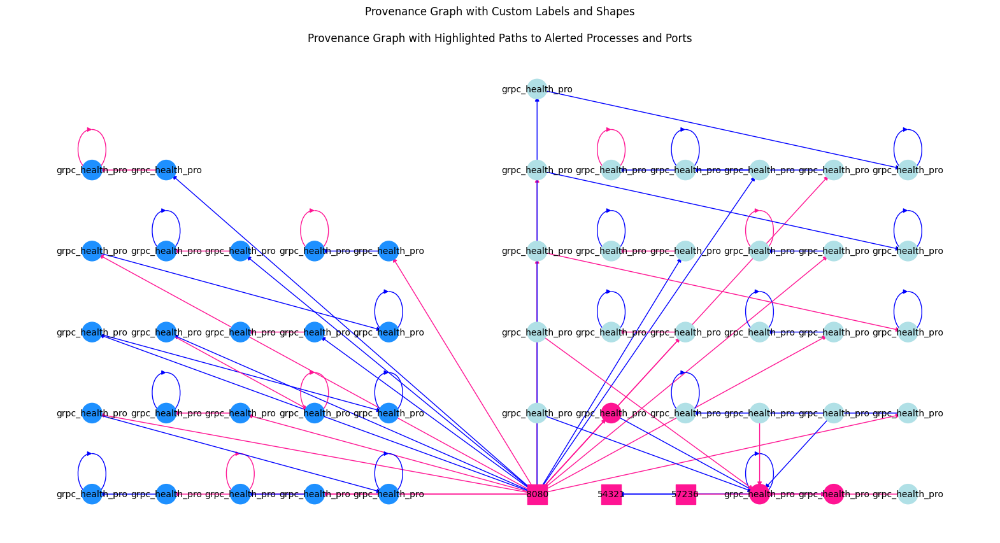

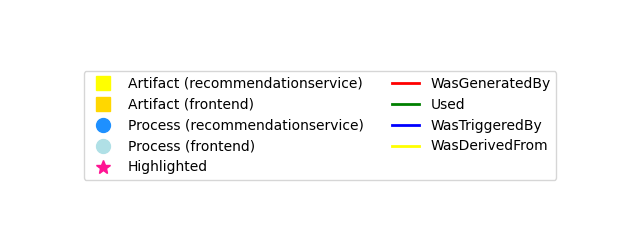

In [81]:
draw_provenance_graph_custom_highlighted_aggregated_names(ag_internet_filter_artifact_df, ag_internet_filter_process_df, ag_internet_filter_edges_df,
                                                          path_alerted_and_ports_artifacts_df, path_alerted_and_ports_processes_df, path_alerted_and_ports_edges_df,plot_title='Provenance Graph with Highlighted Paths to Alerted Processes and Ports')

## Show Results Alerts
result alerts with possible paths as text

### Get Alerted Nodes

In [53]:
svc_list, data_id_list = [], []

# print(PG_highlighted_aggregated.nodes[8080])
svc_list.append(PG_highlighted_aggregated.nodes[8080]['svc'])
data_id_list.append(8080)
# node_ids_list.append(PG_highlighted_aggregated.nodes[8080]['node_ids'])

for from_node, to_node, edge_data in PG_highlighted_aggregated.edges(data=True):
    if edge_data['color'] == 'deeppink' and from_node == 8080:
        if PG_highlighted_aggregated.nodes[to_node]['svc'] == 'recommendationservice':
            if to_node not in [2806, 2811, 2978, 3371, 3554]:
                svc_list.append(PG_highlighted_aggregated.nodes[to_node]['svc'])
                data_id_list.append(to_node)
                # node_ids_list.append(PG_highlighted_aggregated.nodes[to_node]['node_ids'])

df_lm_svc_prov_data = pd.DataFrame({
    'svc': svc_list,
    'data_id': data_id_list,
    # 'node_ids': node_ids_list
})
df_lm_svc_prov_data

,svc,data_id
0,frontend,8080
1,recommendationservice,1789
2,recommendationservice,1799
3,recommendationservice,2398
4,recommendationservice,2427
5,recommendationservice,3365
6,recommendationservice,3540


### Rules Groups

In [ ]:
import os

def aggregate_files_by_directory(root_directory, file_list):
    files_by_directory = {}
    for root, _, files in os.walk(root_directory):
        relative_path = os.path.relpath(root, root_directory).replace(os.sep, '/')
        if not any(d.startswith('.') for d in relative_path.split('/')):
            files_list = files_by_directory.setdefault(relative_path, [])
            for file in files:
                if file in file_list:
                    files_list.append(file)
    # Remove empty values
    files_by_directory = {k: v for k, v in files_by_directory.items() if v}
    return files_by_directory

In [ ]:
sigma_rules_root_directory_path = 'alerts_mechanism/sigma_rules'

In [56]:
frontend_rules = df_alerts[df_alerts['svc']=='frontend']['rules'].values[0]
frontend_rules_by_directory = aggregate_files_by_directory(sigma_rules_root_directory_path, frontend_rules)

frontend_rules_by_directory.keys()

dict_keys(['cloud/azure/activity_logs', 'cloud/azure/audit_logs', 'cloud/azure/identity_protection', 'cloud/m365/threat_management', 'linux/auditd', 'linux/builtin', 'linux/builtin/sudo', 'linux/builtin/vsftpd', 'linux/file_event', 'linux/network_connection', 'linux/process_creation', 'macos/file_event', 'macos/process_creation', 'network/cisco/aaa', 'network/cisco/bgp', 'network/cisco/ldp', 'network/dns', 'network/zeek', 'web/proxy_generic', 'web/webserver_generic', 'windows/builtin/application/mssqlserver', 'windows/builtin/msexchange', 'windows/builtin/ntlm', 'windows/builtin/openssh', 'windows/builtin/security', 'windows/builtin/security/account_management', 'windows/builtin/system/service_control_manager', 'windows/create_remote_thread', 'windows/dns_query', 'windows/file/file_event', 'windows/image_load', 'windows/network_connection', 'windows/pipe_created', 'windows/powershell/powershell_script', 'windows/process_creation', 'windows/registry/registry_event', 'windows/registry/re

In [57]:
recommendationservice_rules = df_alerts[df_alerts['svc']=='recommendationservice']['rules'].values[0]
recommendationservice_rules_by_directory = aggregate_files_by_directory(sigma_rules_root_directory_path, recommendationservice_rules)

recommendationservice_rules_by_directory.keys()

dict_keys(['application/jvm', 'application/rpc_firewall', 'category/antivirus', 'cloud/aws/cloudtrail', 'cloud/azure/activity_logs', 'cloud/azure/audit_logs', 'cloud/azure/identity_protection', 'cloud/azure/privileged_identity_management', 'cloud/azure/signin_logs', 'cloud/gcp/audit', 'cloud/github', 'cloud/m365/threat_management', 'cloud/okta', 'linux/auditd', 'linux/builtin', 'linux/builtin/clamav', 'linux/builtin/sshd', 'linux/file_event', 'linux/network_connection', 'linux/process_creation', 'macos/file_event', 'macos/process_creation', 'network/cisco/aaa', 'network/dns', 'network/zeek', 'web/product/apache', 'web/product/nginx', 'web/proxy_generic', 'web/webserver_generic', 'windows/builtin', 'windows/builtin/application/application_error', 'windows/builtin/application/esent', 'windows/builtin/application/msiinstaller', 'windows/builtin/application/mssqlserver', 'windows/builtin/application/Other', 'windows/builtin/application/windows_error_reporting', 'windows/builtin/applocker',

### Vulnerabilities

In [58]:
ag_vertices_df

,Node_ID,Description,Type,Status
0,1,vulnerablePod(frontend),OR,0
1,2,RULE 0 (vulnerability with remote access-vecto...,AND,0
2,3,"vulExists('CVE-2022-3996',libcrypto3,'3_0_7_r0...",LEAF,1
3,4,"residesOn(frontend,libcrypto3,'3_0_7_r0')",LEAF,1
4,5,"hacl('Internet',frontend,'HTTP','8080')",LEAF,1
5,6,RULE 0 (vulnerability with remote access-vecto...,AND,0
6,7,"vulExists('CVE-2022-3996',libssl3,'3_0_7_r0','...",LEAF,1
7,8,"residesOn(frontend,libssl3,'3_0_7_r0')",LEAF,1
8,9,vulnerablePod(recommendationservice),OR,0
9,10,RULE 1 (vulnerability in pod1 and connection t...,AND,0


In [59]:
# Filter ag_vertices_df by rows that contain substring 'vulExists' in 'Description' column
vul_exists_df = ag_vertices_df[ag_vertices_df['Description'].str.contains('vulExists', case=False)]['Description']
vul_exists_df

2     vulExists('CVE-2022-3996',libcrypto3,'3_0_7_r0...
6     vulExists('CVE-2022-3996',libssl3,'3_0_7_r0','...
10    vulExists('CVE-2019-8457',libdb5_3,'5_3_28+dfs...
14    vulExists('CVE-2021-46848',libtasn1_6,'4_16_0_...
Name: Description, dtype: object

### Print

In [60]:
print(f'Possible lateral movement detected\n'
      f"from 'frontend', port 8080 with vulnerabilities [CVE-2022-3996] and alerts ['linux/network_connection', 'linux/process_creation', 'windows/network_connection', 'windows/process_creation']\n"
      f"to 'recommendationservice', processes [1789, 1799, 2398, 2427, 3365, 3540] with vulnerabilities [CVE-2019-8457, CVE-2021-46848] and alerts ['application/jvm', 'application/rpc_firewall', 'linux/process_creation', 'windows/process_creation']")

Possible lateral movement detected
from 'frontend', port 8080 with vulnerabilities [CVE-2022-3996] and alerts ['linux/network_connection', 'linux/process_creation', 'windows/network_connection', 'windows/process_creation']
to 'recommendationservice', processes [1789, 1799, 2398, 2427, 3365, 3540] with vulnerabilities [CVE-2019-8457, CVE-2021-46848] and alerts ['application/jvm', 'application/rpc_firewall', 'linux/process_creation', 'windows/process_creation']


In [65]:
import re
pattern_vuln = r"CVE.*?(?=\')"

In [77]:
frontend_port = df_lm_svc_prov_data[df_lm_svc_prov_data['svc']=='frontend']['data_id'].values
frontend_vuln = re.findall(pattern_vuln,vul_exists_df.iloc[1])

frontend_move = pd.DataFrame({
    'Service': ['frontend'],
    'Ports': frontend_port,
    'Vulnerabilities': frontend_vuln,
    'Alerts': [['linux/file_event', 'linux/builtin', 'linux/network_connection', 'linux/process_creation', 'network/dns', 'network/zeek', 'web/proxy_generic', 'web/webserver_generic']]
})

frontend_move

,Service,Ports,Vulnerabilities,Alerts
0,frontend,8080,CVE-2022-3996,"[linux/file_event, linux/builtin, linux/networ..."


In [78]:
recommendation_processes = df_lm_svc_prov_data[df_lm_svc_prov_data['svc'] == 'recommendationservice']['data_id'].to_list()
recommendation_vuln = re.findall(pattern_vuln,vul_exists_df.iloc[2]+vul_exists_df.iloc[3])

recommendation_move = pd.DataFrame({
    'Service': ['recommendationservice'],
    'Processes': [recommendation_processes],
    'Vulnerabilities': [recommendation_vuln],
    'Alerts': [['application/jvm', 'cloud/aws/cloudtrail', 'application/rpc_firewall', 'linux/auditd', 'linux/builtin', 'linux/file_event', 'linux/network_connection', 'linux/process_creation', 'network/dns', 'network/zeek', 'web/proxy_generic', 'web/webserver_generic']]
})

recommendation_move

,Service,Processes,Vulnerabilities,Alerts
0,recommendationservice,"[1789, 1799, 2398, 2427, 3365, 3540]","[CVE-2019-8457, CVE-2021-46848]","[application/jvm, cloud/aws/cloudtrail, applic..."


In [79]:
from tabulate import tabulate
print(f'Possible lateral movement detected\n'
      f"from    \n{tabulate(frontend_move, headers='keys', tablefmt='simple', showindex=False, maxcolwidths=[None, None, None, 40])}\n"
      f"to  \n{tabulate(recommendation_move, headers='keys', tablefmt='simple', showindex=False, maxcolwidths=[None, 20, 20, 40])}")

Possible lateral movement detected
from    
Service      Ports  Vulnerabilities    Alerts
---------  -------  -----------------  ----------------------------------------
frontend      8080  CVE-2022-3996      ['linux/file_event', 'linux/builtin',
                                       'linux/network_connection',
                                       'linux/process_creation', 'network/dns',
                                       'network/zeek', 'web/proxy_generic',
                                       'web/webserver_generic']
to  
Service                Processes           Vulnerabilities    Alerts
---------------------  ------------------  -----------------  ----------------------------------------
recommendationservice  [1789, 1799, 2398,  ['CVE-2019-8457',  ['application/jvm',
                       2427, 3365, 3540]   'CVE-2021-46848']  'cloud/aws/cloudtrail',
                                                              'application/rpc_firewall',
                               